# Importy

In [1]:
! pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.0/128.0 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 32.0 MB/s eta 0:00:00


In [2]:
import os
import math
import tqdm
import warnings
import datetime

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras_tuner as kt
import tensorflow as tf

from itertools import product

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import GRU
from tensorflow.keras.layers import Dense

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler#, MinMaxScaler
from sklearn.metrics import mean_squared_error#, r
#pd.options.mode.chained_assignment = None

warnings.filterwarnings("ignore")

Using TensorFlow backend


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Ładowanie danych

In [6]:
path = 'https://raw.githubusercontent.com/annaStykowska/Time-series-analysis-including-NN-/main/Monthly-hourly-load-values_2006-2015.xlsx'

In [7]:
# wczytanie danych
data=pd.read_excel(path, header=3)
data = data.iloc[3:]

# Preprocessing

In [8]:
pd.set_option('display.max_columns', None)

In [9]:
# utworzenie daty z pojedynczych kolumn do innej kolumny
data.rename(columns = {'Year':'year', 'Month':'month','Day':'day'}, inplace = True)
data['date']=pd.to_datetime(data[['year','month','day']])
# usunięcie niepotrzebnych kolumn
# data=data.drop(['Country','year','month','day','Coverage ratio'],axis=1)
data=data.drop(['year','month','day','Coverage ratio'],axis=1)
data['load']=data.iloc[:,1:-1].sum(axis=1)

In [10]:
# ustawienie indeksu: data
data = data.set_index("date")
data.index = pd.to_datetime(data.index)
data

,Country,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,load
date,,,,,,,,,,,,,,,,,,,,,,,,,,
2006-01-04,AT,6522.0,6217.0,6027.0,5802.0,5866.0,6289.0,6730.0,7554.0,7947.0,8180.0,8309.0,8241.0,8253.0,8233.0,8145.0,8081.0,8331.0,8470.0,8460.0,8185.0,7759.0,7242.0,7441.0,6981.0,179265.0
2006-01-05,AT,6575.0,6237.0,6065.0,5841.0,5887.0,6283.0,6704.0,7491.0,7964.0,8202.0,8337.0,8434.0,8240.0,8153.0,8046.0,8042.0,8268.0,8361.0,8453.0,8114.0,7606.0,7139.0,7333.0,6888.0,178663.0
2006-01-06,AT,6449.0,6138.0,5936.0,5647.0,5568.0,5560.0,5381.0,5793.0,6146.0,6554.0,6884.0,7067.0,6827.0,6690.0,6544.0,6484.0,6791.0,7151.0,7163.0,7061.0,6739.0,6380.0,6775.0,6420.0,154148.0
2006-01-07,AT,6070.0,5793.0,5610.0,5377.0,5359.0,5544.0,5568.0,6145.0,6578.0,6899.0,7037.0,7160.0,6995.0,6910.0,6829.0,6870.0,7124.0,7398.0,7326.0,7130.0,6749.0,6393.0,6749.0,6434.0,156047.0
2006-01-08,AT,6012.0,5704.0,5550.0,5305.0,5217.0,5301.0,5094.0,5535.0,5918.0,6403.0,6741.0,6953.0,6682.0,6482.0,6303.0,6244.0,6588.0,7123.0,7252.0,7195.0,6841.0,6488.0,6894.0,6524.0,150349.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-27,UA_W,534.0,523.0,511.0,524.0,537.0,566.0,612.0,662.0,682.0,690.0,665.0,666.0,658.0,662.0,669.0,719.0,783.0,779.0,771.0,726.0,721.0,663.0,582.0,547.0,15452.0
2015-12-28,UA_W,510.0,521.0,519.0,529.0,551.0,637.0,744.0,803.0,831.0,849.0,808.0,816.0,794.0,796.0,805.0,851.0,885.0,875.0,868.0,834.0,782.0,724.0,642.0,601.0,17575.0
2015-12-29,UA_W,550.0,535.0,538.0,545.0,597.0,685.0,762.0,813.0,838.0,825.0,809.0,795.0,777.0,787.0,797.0,850.0,905.0,889.0,878.0,847.0,828.0,763.0,692.0,635.0,17940.0


In [11]:
# wybór państwa - Polska, Włochy, Niemcy
dataPL=data.loc[data['Country']=='PL']
dataIT=data.loc[data['Country']=='IT']
dataDE=data.loc[data['Country']=='DE']
dataPL.shape

(3652, 26)

In [12]:
# sprawdzenie braków PL
dataPL.isnull().sum() # 10 wartości NULL - godzina 2

Country     0
0           0
1           0
2          10
3           0
4           0
5           0
6           0
7           0
8           0
9           0
10          0
11          0
12          0
13          0
14          0
15          0
16          0
17          0
18          0
19          0
20          0
21          0
22          0
23          0
load        0
dtype: int64

In [13]:
# sprawdzenie braków IT
dataIT.isnull().sum() # 10 wartości NULL - godzina 2

Country     0
0           0
1           0
2          10
3           0
4           0
5           0
6           0
7           0
8           0
9           0
10          0
11          0
12          0
13          0
14          0
15          0
16          0
17          0
18          0
19          0
20          0
21          0
22          0
23          0
load        0
dtype: int64

In [14]:
# sprawdzenie braków DE
dataDE.isnull().sum() # 10 wartości NULL - godzina 2

Country     0
0           0
1           0
2          10
3           0
4           0
5           0
6           0
7           0
8           0
9           0
10          0
11          0
12          0
13          0
14          0
15          0
16          0
17          0
18          0
19          0
20          0
21          0
22          0
23          0
load        0
dtype: int64

In [15]:
dataPL[dataPL.isnull().any(axis=1)] # braki -> zmiana czasu

,Country,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,load
date,,,,,,,,,,,,,,,,,,,,,,,,,,
2006-03-26,PL,13744.0,13130.0,NaN,12853.0,12784.0,12767.0,12413.0,12638.0,13169.0,13822.0,14268.0,14580.0,14563.0,14574.0,14438.0,14220.0,13966.0,14173.0,14690.0,16210.0,16445.0,15948.0,15396.0,14447.0,325238.0
2007-03-25,PL,13536.0,13008.0,NaN,12728.0,12593.0,12615.0,12332.0,12570.0,13199.0,13911.0,14351.0,14511.0,14401.0,14289.0,13983.0,13626.0,13414.0,13388.0,13816.0,15927.0,16469.0,15888.0,15110.0,14032.0,319697.0
2008-03-30,PL,13904.0,13382.0,NaN,13081.0,13083.0,12910.0,12457.0,12827.0,13473.0,14203.0,14609.0,14777.0,14759.0,14690.0,14400.0,14153.0,13756.0,13705.0,14150.0,15886.0,16919.0,16293.0,15445.0,14384.0,327246.0
2009-03-29,PL,12513.0,11852.0,NaN,11580.0,11528.0,11478.0,11216.0,11568.0,12377.0,13150.0,13773.0,14008.0,14061.0,14060.0,13982.0,13685.0,13471.0,13537.0,14008.0,15643.0,16107.0,15415.0,14564.0,13513.0,307089.0
2010-03-28,PL,12590.0,12124.0,NaN,11762.0,11735.0,11629.0,11453.0,11911.0,12757.0,13555.0,14126.0,14256.0,14189.0,14204.0,14066.0,13849.0,13696.0,13723.0,14096.0,15717.0,16398.0,15688.0,14857.0,13686.0,312067.0
2011-03-27,PL,13901.0,13311.0,NaN,12991.0,12887.0,12869.0,12604.0,12894.0,13707.0,14567.0,15100.0,15210.0,15253.0,15193.0,14981.0,14483.0,14217.0,14266.0,14747.0,16573.0,17130.0,16507.0,15553.0,14522.0,333466.0
2012-03-25,PL,12980.0,12459.0,NaN,12158.0,12165.0,12252.0,12057.0,12471.0,13271.0,14070.0,14709.0,14823.0,14811.0,14780.0,14476.0,14049.0,13823.0,13920.0,14246.0,16119.0,16792.0,16009.0,15094.0,13868.0,321402.0
2013-03-31,PL,12721.0,12060.0,NaN,11737.0,11760.0,11907.0,11468.0,11910.0,12856.0,13281.0,13330.0,13295.0,13234.0,13224.0,13189.0,12848.0,12713.0,12773.0,13091.0,14213.0,14913.0,14562.0,14058.0,13181.0,298324.0
2014-03-30,PL,13210.0,12647.0,NaN,12347.0,12384.0,12270.0,12040.0,12557.0,13436.0,14312.0,14855.0,14992.0,14961.0,14778.0,14449.0,13981.0,13667.0,13797.0,14152.0,15894.0,16729.0,15866.0,14921.0,13756.0,322001.0


In [16]:
dataIT[dataIT.isnull().any(axis=1)] # braki -> zmiana czasu

,Country,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,load
date,,,,,,,,,,,,,,,,,,,,,,,,,,
2006-03-26,IT,29727.0,26273.0,NaN,25922.0,25762.0,25846.0,26167.0,27094.0,29498.0,31540.0,32288.0,32614.0,31650.0,29905.0,29803.0,29044.0,28737.0,29188.0,31082.0,35457.0,35595.0,34053.0,31860.0,29111.0,688216.0
2007-03-25,IT,28596.0,26795.0,NaN,26764.0,26385.0,26268.0,26659.0,27057.0,28157.0,30449.0,32691.0,33921.0,34780.0,33677.0,32083.0,31733.0,31415.0,30993.0,32398.0,34776.0,37690.0,38014.0,35447.0,33064.0,719812.0
2008-03-30,IT,26878.0,26717.0,NaN,26195.0,26109.0,26046.0,26457.0,26986.0,29186.0,31322.0,32273.0,32705.0,31958.0,30571.0,30116.0,29518.0,29272.0,29453.0,30995.0,35356.0,36287.0,34929.0,32674.0,29859.0,691862.0
2009-03-29,IT,24055.0,23903.0,NaN,23426.0,23317.0,23649.0,24183.0,24704.0,26706.0,29093.0,30491.0,31540.0,30846.0,29123.0,28713.0,28250.0,28292.0,28975.0,30363.0,33654.0,33728.0,32306.0,29945.0,27097.0,646359.0
2010-03-28,IT,27117.0,25357.0,NaN,24476.0,24035.0,24236.0,24805.0,25107.0,26874.0,29104.0,29997.0,30390.0,30101.0,28428.0,27767.0,27706.0,27322.0,27548.0,28695.0,31688.0,34855.0,33915.0,31835.0,28865.0,650223.0
2011-03-27,IT,28548.0,26504.0,NaN,25552.0,25222.0,25293.0,25947.0,25761.0,27229.0,29040.0,30025.0,30456.0,30480.0,29060.0,28470.0,28139.0,28058.0,28693.0,30558.0,34115.0,36104.0,34878.0,32719.0,29889.0,670740.0
2012-03-25,IT,28008.0,26394.0,NaN,25460.0,25072.0,25170.0,25858.0,25664.0,27672.0,30172.0,31702.0,32471.0,32649.0,31303.0,29876.0,29720.0,29337.0,29552.0,30056.0,33585.0,36204.0,35107.0,33120.0,30357.0,684509.0
2013-03-31,IT,25700.0,23786.0,NaN,23013.0,22300.0,22325.0,22887.0,22801.0,24802.0,27036.0,28121.0,29392.0,28803.0,26376.0,25129.0,24649.0,24656.0,24911.0,25412.0,27926.0,31207.0,30724.0,29551.0,26890.0,598397.0
2014-03-30,IT,26071.0,24406.0,NaN,23167.0,22849.0,23032.0,23546.0,24004.0,26458.0,29257.0,30885.0,31493.0,31360.0,29889.0,28760.0,27975.0,27425.0,27306.0,27734.0,31052.0,33870.0,32397.0,30038.0,27413.0,640387.0


In [17]:
#dataNULL.iloc[:,[-2,-1,2]]

In [18]:
dataIT[dataIT["load"] == 0.0]

,Country,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,load
date,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-07-10,IT,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
dataIT = dataIT.mask(dataIT['load']<10)

In [20]:
# uzupełnienie braków - ta sama kolumna, opóźnienie o 7 -> godzina 2 z tygodnia wcześniej
for dataCountry in [dataPL,dataIT,dataDE]:
  dataCountry.fillna(dataCountry.shift(7), inplace=True)

In [21]:
dataIT[dataIT.index=='2008-07-10']

,Country,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,load
date,,,,,,,,,,,,,,,,,,,,,,,,,,
2008-07-10,IT,37647.0,36026.0,35016.0,34554.0,34813.0,34813.0,39793.0,46118.0,51378.0,53823.0,54652.0,54931.0,52756.0,53496.0,54087.0,54230.0,53966.0,51992.0,49958.0,48094.0,47682.0,46664.0,43672.0,40643.0,1110804.0


In [22]:
# podział: treningowe i testowe,  usunięcie kolumny 'Country'
#for dataCountry in [dataPL,dataIT,dataDE]:
#  'train'+str(dataCountry)[-2:] = dataCountry.loc[dataCountry.index < '2012-12-30']
data=data.drop(['Country'],axis=1)
dataPL=dataPL.drop(['Country'],axis=1)
dataIT=dataIT.drop(['Country'],axis=1)
dataDE=dataDE.drop(['Country'],axis=1)
trainPL = dataPL.loc[dataPL.index < '2012-12-30']
testPL = dataPL.loc[dataPL.index > '2012-12-29']
trainIT = dataIT.loc[dataIT.index < '2012-12-30']
testIT = dataIT.loc[dataIT.index > '2012-12-29']
trainDE = dataDE.loc[dataDE.index < '2012-12-30']
testDE = dataDE.loc[dataDE.index > '2012-12-29']
trainPL

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,load
date,,,,,,,,,,,,,,,,,,,,,,,,,
2006-01-01,14268.0,13602.0,13027.0,12606.0,12393.0,12231.0,12119.0,11926.0,11787.0,12098.0,12396.0,12747.0,13013.0,13379.0,13460.0,13877.0,15456.0,16046.0,16165.0,16347.0,16016.0,15329.0,14508.0,13480.0,328276.0
2006-01-02,12773.0,12420.0,12183.0,12207.0,12450.0,13167.0,15103.0,16801.0,17551.0,18090.0,18343.0,18592.0,18695.0,18909.0,18726.0,19061.0,20380.0,20505.0,20282.0,20200.0,19572.0,18697.0,17378.0,16067.0,408152.0
2006-01-03,15016.0,14464.0,14195.0,14170.0,14343.0,14818.0,16556.0,18278.0,18744.0,19067.0,19221.0,19443.0,19481.0,19635.0,19417.0,19554.0,20858.0,21067.0,20709.0,20643.0,19923.0,18939.0,17689.0,16411.0,432641.0
2006-01-04,15380.0,14757.0,14435.0,14315.0,14473.0,14969.0,16558.0,18311.0,18750.0,19066.0,19066.0,19346.0,19492.0,19650.0,19468.0,19632.0,20873.0,21124.0,20903.0,20713.0,20117.0,18862.0,17607.0,16369.0,434236.0
2006-01-05,15321.0,14819.0,14515.0,14512.0,14600.0,15021.0,16830.0,18490.0,18946.0,19266.0,19408.0,19593.0,19676.0,19954.0,19759.0,19882.0,21073.0,21373.0,21124.0,21022.0,20423.0,19120.0,17938.0,16626.0,439291.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-12-25,13118.0,12395.0,11837.0,11483.0,11420.0,11520.0,11752.0,11819.0,12067.0,12809.0,13240.0,13438.0,13436.0,13615.0,13449.0,13726.0,14886.0,15013.0,15123.0,15323.0,15200.0,14825.0,14276.0,13412.0,319182.0
2012-12-26,12434.0,11717.0,11356.0,11223.0,11296.0,11471.0,11675.0,11665.0,11902.0,12632.0,13171.0,13450.0,13568.0,13780.0,13667.0,13822.0,15131.0,15482.0,15611.0,15644.0,15458.0,14992.0,14378.0,13315.0,318840.0
2012-12-27,12446.0,11796.0,11518.0,11547.0,11743.0,12360.0,14021.0,15333.0,16273.0,17351.0,17821.0,18030.0,18072.0,18342.0,18141.0,18185.0,19375.0,19502.0,19270.0,19107.0,18488.0,17513.0,16334.0,15074.0,387642.0


In [23]:
# standaryzacja PL
scalerPL=StandardScaler()
scalerPL = scalerPL.fit(trainPL[['load']])
train_standardizedPL = scalerPL.transform(trainPL[['load']])
test_standardizedPL  = scalerPL.transform(testPL[['load']])

# standaryzacja IT
scalerIT=StandardScaler()
scalerIT = scalerIT.fit(trainIT[['load']])
train_standardizedIT = scalerIT.transform(trainIT[['load']])
test_standardizedIT  = scalerIT.transform(testIT[['load']])

# standaryzacja PL
scalerDE=StandardScaler()
scalerDE = scalerDE.fit(trainDE[['load']])
train_standardizedDE = scalerDE.transform(trainDE[['load']])
test_standardizedDE  = scalerDE.transform(testDE[['load']])

In [24]:
# standaryzacja
# scalerPL=StandardScaler()
# scalerPL = scalerPL.fit(trainPL[['load']])

# train_standardized = scalerPL.transform(trainPL[['load']])
# test_standardized  = scalerPL.transform(testPL[['load']])

# Exploracja danych

In [25]:
dataPL

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,load
date,,,,,,,,,,,,,,,,,,,,,,,,,
2006-01-01,14268.0,13602.0,13027.0,12606.0,12393.0,12231.0,12119.0,11926.0,11787.0,12098.0,12396.0,12747.0,13013.0,13379.0,13460.0,13877.0,15456.0,16046.0,16165.0,16347.0,16016.0,15329.0,14508.0,13480.0,328276.0
2006-01-02,12773.0,12420.0,12183.0,12207.0,12450.0,13167.0,15103.0,16801.0,17551.0,18090.0,18343.0,18592.0,18695.0,18909.0,18726.0,19061.0,20380.0,20505.0,20282.0,20200.0,19572.0,18697.0,17378.0,16067.0,408152.0
2006-01-03,15016.0,14464.0,14195.0,14170.0,14343.0,14818.0,16556.0,18278.0,18744.0,19067.0,19221.0,19443.0,19481.0,19635.0,19417.0,19554.0,20858.0,21067.0,20709.0,20643.0,19923.0,18939.0,17689.0,16411.0,432641.0
2006-01-04,15380.0,14757.0,14435.0,14315.0,14473.0,14969.0,16558.0,18311.0,18750.0,19066.0,19066.0,19346.0,19492.0,19650.0,19468.0,19632.0,20873.0,21124.0,20903.0,20713.0,20117.0,18862.0,17607.0,16369.0,434236.0
2006-01-05,15321.0,14819.0,14515.0,14512.0,14600.0,15021.0,16830.0,18490.0,18946.0,19266.0,19408.0,19593.0,19676.0,19954.0,19759.0,19882.0,21073.0,21373.0,21124.0,21022.0,20423.0,19120.0,17938.0,16626.0,439291.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-27,13123.0,11032.0,10749.0,10691.0,10773.0,11018.0,11681.0,12024.0,12407.0,13379.0,14090.0,14348.0,14463.0,14541.0,14472.0,14719.0,16072.0,16366.0,16435.0,16479.0,16104.0,15301.0,14464.0,13428.0,328159.0
2015-12-28,12522.0,12099.0,11909.0,11765.0,12002.0,12826.0,14816.0,16390.0,17497.0,18353.0,18553.0,18800.0,18795.0,18958.0,18753.0,18970.0,19910.0,20045.0,19751.0,19498.0,18925.0,17714.0,16445.0,15106.0,400402.0
2015-12-29,14080.0,13475.0,13161.0,13142.0,13330.0,13966.0,15775.0,17100.0,17941.0,18716.0,18982.0,19123.0,19116.0,19256.0,18988.0,19103.0,20337.0,20455.0,20150.0,20001.0,19369.0,18154.0,16913.0,15624.0,416257.0


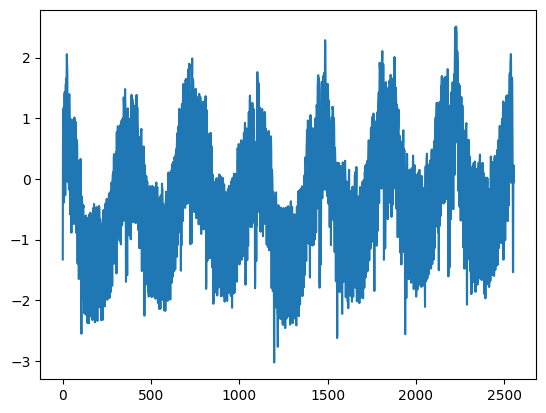

In [26]:
plt.plot(train_standardizedPL) # po standaryzacji PL

Text(0.5, 1.0, 'Średnie zużycie prądu w Polsce (godzinowo)')

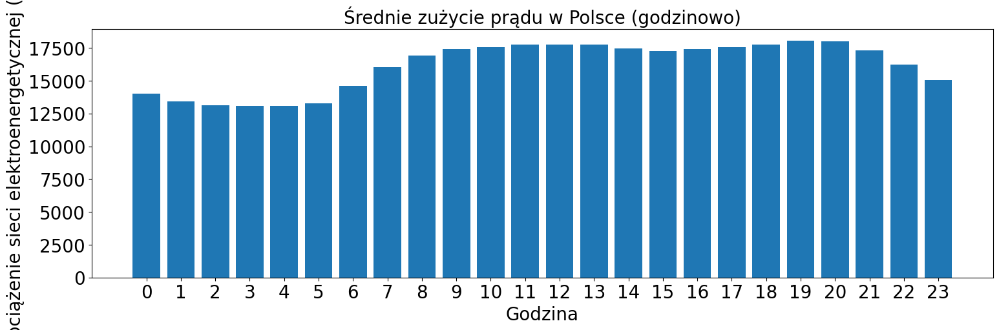

In [27]:
plt.figure(figsize=(18,5))
plt.bar(trainPL.mean()[0:-1].index,trainPL.mean()[0:-1])
plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
plt.xlabel("Godzina", fontsize=20)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Średnie zużycie prądu w Polsce (godzinowo)',fontsize=20)

Text(0.5, 1.0, 'Średnie zużycie prądu w Niemczech (godzinowo)')

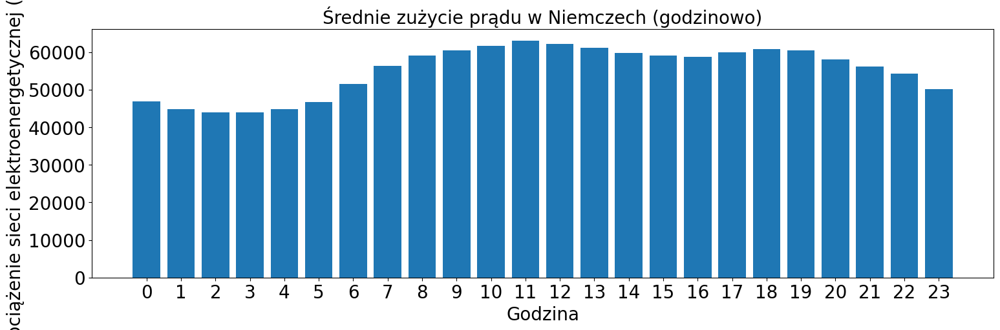

In [28]:
plt.figure(figsize=(18,5))
plt.bar(trainDE.mean()[0:-1].index,trainDE.mean()[0:-1])
plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
plt.xlabel("Godzina", fontsize=20)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Średnie zużycie prądu w Niemczech (godzinowo)',fontsize=20)

Text(0.5, 1.0, 'Średnie zużycie prądu we Włoszech (godzinowo)')

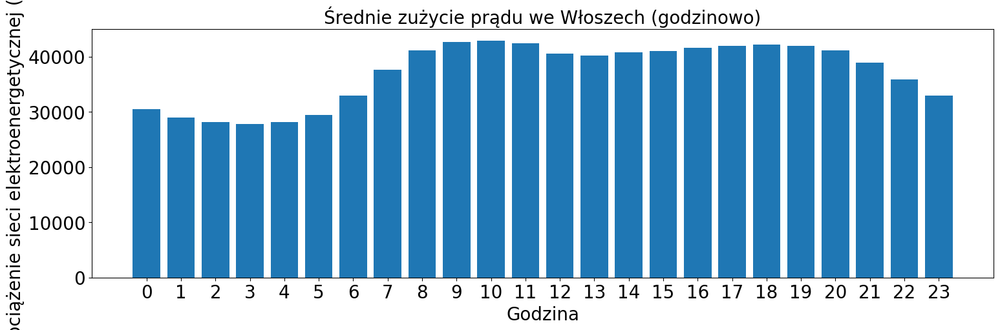

In [29]:
plt.figure(figsize=(18,5))
plt.bar(trainIT.mean()[0:-1].index,trainIT.mean()[0:-1])
plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
plt.xlabel("Godzina", fontsize=20)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Średnie zużycie prądu we Włoszech (godzinowo)',fontsize=20)

In [30]:
# wykres sredniego obciążenia energetycznego dla poszczegolnych godzin w zaleznosci od pory roku,
season = np.array([
    None,
    'zima', 'zima',
    'wiosna', 'wiosna', 'wiosna',
    'lato', 'lato', 'lato',
    'jesień', 'jesień', 'jesień',
    'zima'
])
# PL
grpSeasPL = season[trainPL.index.month]
trainPL['season']=grpSeasPL
meanSeasonPL = trainPL.groupby(['season']).mean()
# IT
grpSeasIT = season[trainIT.index.month]
trainIT['season']=grpSeasIT
meanSeasonIT = trainIT.groupby(['season']).mean()
# DE
grpSeasDE = season[trainDE.index.month]
trainDE['season']=grpSeasDE
meanSeasonDE = trainDE.groupby(['season']).mean()

Text(0.5, 1.0, 'Średnie godzinowe zużycie \nprądu w Polsce w zależności od pory roku')

<Figure size 1800x500 with 0 Axes>

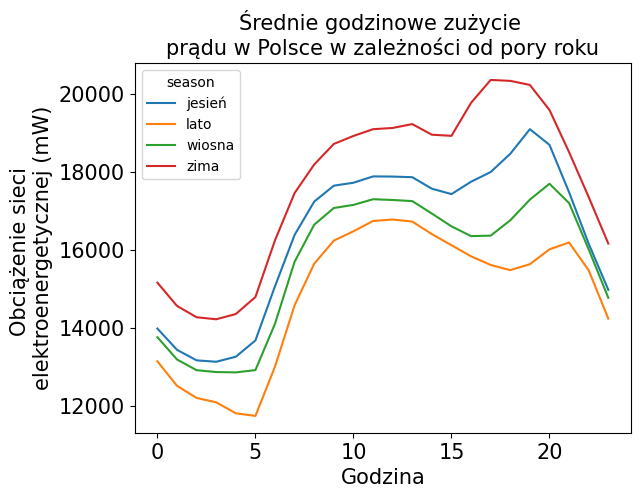

In [31]:
plt.figure(figsize=(18,5))
meanSeasonPL.T[:-1].plot()
plt.ylabel("Obciążenie sieci \nelektroenergetycznej (mW)", fontsize=15)
plt.xlabel("Godzina", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Średnie godzinowe zużycie \nprądu w Polsce w zależności od pory roku',fontsize=15)

Text(0.5, 1.0, 'Średnie godzinowe zużycie \nprądu we Włoszech w zależności od pory roku')

<Figure size 1800x500 with 0 Axes>

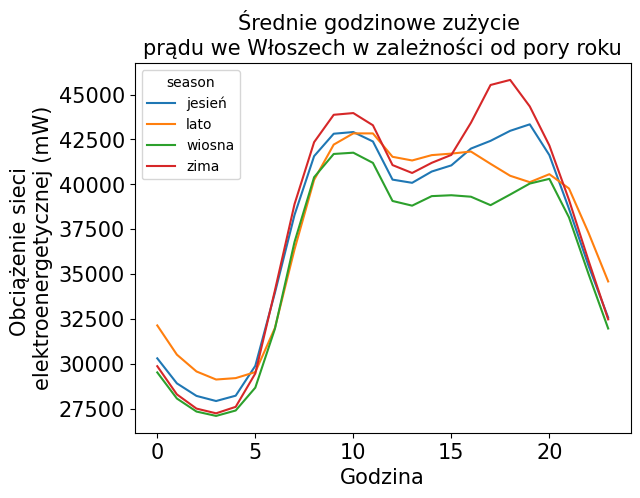

In [32]:
plt.figure(figsize=(18,5))
meanSeasonIT.T[:-1].plot()
plt.ylabel("Obciążenie sieci \nelektroenergetycznej (mW)", fontsize=15)
plt.xlabel("Godzina", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Średnie godzinowe zużycie \nprądu we Włoszech w zależności od pory roku',fontsize=15)

Text(0.5, 1.0, 'Średnie godzinowe zużycie \nprądu w Niemczech w zależności od pory roku')

<Figure size 1800x500 with 0 Axes>

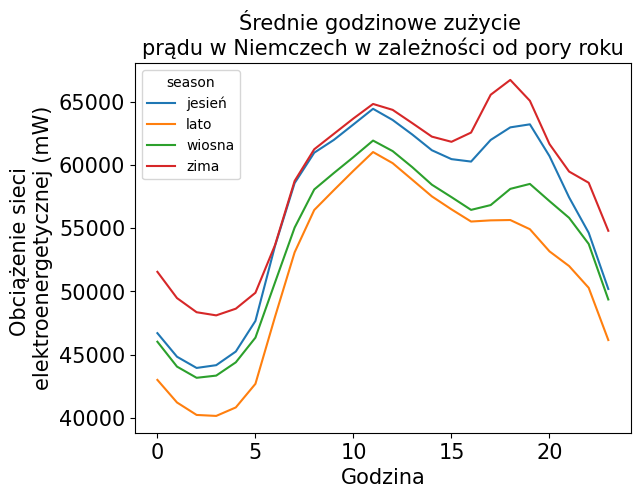

In [33]:
plt.figure(figsize=(18,5))
meanSeasonDE.T[:-1].plot()
plt.ylabel("Obciążenie sieci \nelektroenergetycznej (mW)", fontsize=15)
plt.xlabel("Godzina", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Średnie godzinowe zużycie \nprądu w Niemczech w zależności od pory roku',fontsize=15)

In [34]:
weekDay = np.array(['Niedz','Pon', 'Wt', 'Śr','Czw','Pt','Sb'])
# PL
trainPL['day'] = np.resize(weekDay, trainPL.shape[0])
meanSeasonWeekDayPL = trainPL.groupby(['season','day']).mean()
# IT
trainIT['day'] = np.resize(weekDay, trainIT.shape[0])
meanSeasonWeekDayIT = trainIT.groupby(['season','day']).mean()
# DE
trainDE['day'] = np.resize(weekDay, trainDE.shape[0])
meanSeasonWeekDayDE = trainDE.groupby(['season','day']).mean()
meanSeasonWeekDayPL['load']

season  day  
jesień  Czw      413298.230769
        Niedz    332462.087912
        Pon      399885.703297
        Pt       411737.373626
        Sb       373026.527473
        Wt       413142.296703
        Śr       414941.549451
lato    Czw      372923.880435
        Niedz    299347.586957
        Pon      361343.586957
        Pt       373387.451613
        Sb       338385.582418
        Wt       375455.336957
        Śr       376498.619565
wiosna  Czw      398233.268817
        Niedz    316296.304348
        Pon      375892.684783
        Pt       395673.659341
        Sb       359033.891304
        Wt       394567.978261
        Śr       399143.717391
zima    Czw      444239.539326
        Niedz    366430.355556
        Pon      431709.766667
        Pt       439252.466667
        Sb       402943.945055
        Wt       442759.033333
        Śr       445673.644444
Name: load, dtype: float64

In [35]:
weekDays = {'Niedz':0,'Pon':1, 'Wt':2, 'Śr':3,'Czw':4,'Pt':5,'Sb':6}
# PL
zimaPL = meanSeasonWeekDayPL['load']["zima"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
zimaPL = zimaPL.rename(columns={"load":"zima"})
latoPL = meanSeasonWeekDayPL['load']["lato"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
latoPL = latoPL.rename(columns={"load":"lato"})
jesieńPL = meanSeasonWeekDayPL['load']["jesień"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
jesieńPL = jesieńPL.rename(columns={"load":"jesień"})
wiosnaPL = meanSeasonWeekDayPL['load']["wiosna"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
wiosnaPL = wiosnaPL.rename(columns={"load":"wiosna"})

#IT
zimaIT = meanSeasonWeekDayIT['load']["zima"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
zimaIT = zimaIT.rename(columns={"load":"zima"})
latoIT = meanSeasonWeekDayIT['load']["lato"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
latoIT = latoIT.rename(columns={"load":"lato"})
jesieńIT = meanSeasonWeekDayIT['load']["jesień"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
jesieńIT = jesieńIT.rename(columns={"load":"jesień"})
wiosnaIT = meanSeasonWeekDayIT['load']["wiosna"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
wiosnaIT = wiosnaIT.rename(columns={"load":"wiosna"})

# DE
zimaDE = meanSeasonWeekDayDE['load']["zima"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
zimaDE = zimaDE.rename(columns={"load":"zima"})
latoDE = meanSeasonWeekDayDE['load']["lato"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
latoDE = latoDE.rename(columns={"load":"lato"})
jesieńDE = meanSeasonWeekDayDE['load']["jesień"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
jesieńDE = jesieńDE.rename(columns={"load":"jesień"})
wiosnaDE = meanSeasonWeekDayDE['load']["wiosna"].reset_index().sort_values(by=['day'], key=lambda x: x.map(weekDays)).set_index("day")
wiosnaDE = wiosnaDE.rename(columns={"load":"wiosna"})


Text(0.5, 1.0, 'Średnie godzinowe zużycie \nprądu w Polsce zależności od pory roku')

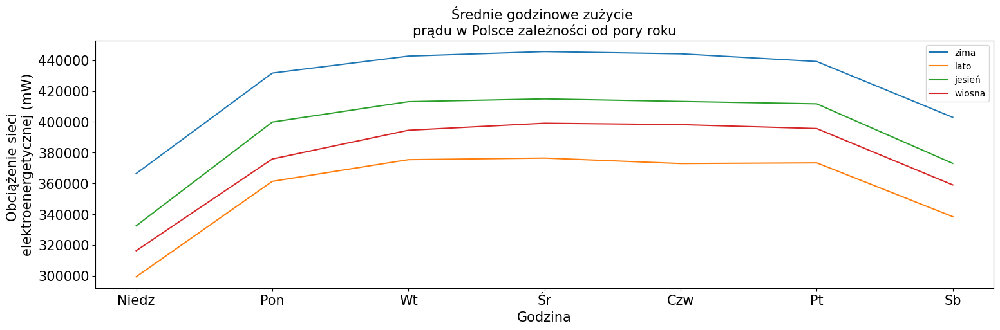

In [36]:
# season -> labels; day -> xaxis
plt.figure(figsize=(18,5))
zimaPL["zima"].plot()
latoPL["lato"].plot()
jesieńPL["jesień"].plot()
wiosnaPL["wiosna"].plot()
plt.ylabel("Obciążenie sieci \nelektroenergetycznej (mW)", fontsize=15)
plt.xlabel("Godzina", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend()
plt.title('Średnie godzinowe zużycie \nprądu w Polsce zależności od pory roku',fontsize=15)

Text(0.5, 1.0, 'Średnie godzinowe zużycie \nprądu we Włoszech zależności od pory roku')

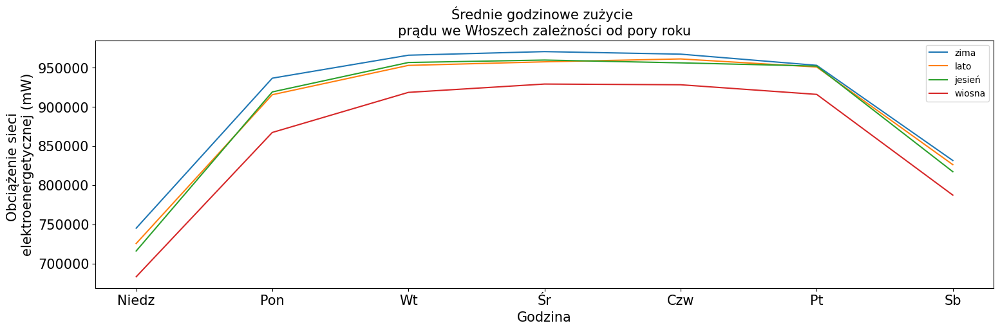

In [37]:
# season -> labels; day -> xaxis
plt.figure(figsize=(18,5))
zimaIT["zima"].plot()
latoIT["lato"].plot()
jesieńIT["jesień"].plot()
wiosnaIT["wiosna"].plot()
plt.ylabel("Obciążenie sieci \nelektroenergetycznej (mW)", fontsize=15)
plt.xlabel("Godzina", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend()
plt.title('Średnie godzinowe zużycie \nprądu we Włoszech zależności od pory roku',fontsize=15)

Text(0.5, 1.0, 'Średnie godzinowe zużycie \nprądu w Niemczech zależności od pory roku')

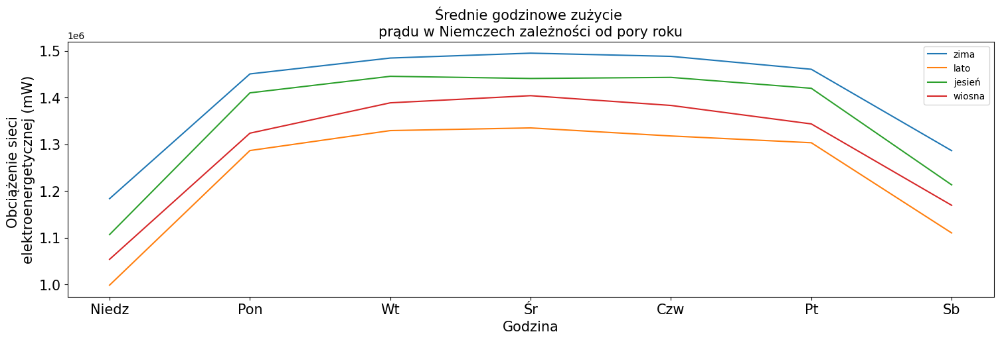

In [38]:
# season -> labels; day -> xaxis
plt.figure(figsize=(18,5))
zimaDE["zima"].plot()
latoDE["lato"].plot()
jesieńDE["jesień"].plot()
wiosnaDE["wiosna"].plot()
plt.ylabel("Obciążenie sieci \nelektroenergetycznej (mW)", fontsize=15)
plt.xlabel("Godzina", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend()
plt.title('Średnie godzinowe zużycie \nprądu w Niemczech zależności od pory roku',fontsize=15)

Text(0.5, 1.0, 'Zużycie prądu w Polsce w latach 2006 - 2012')

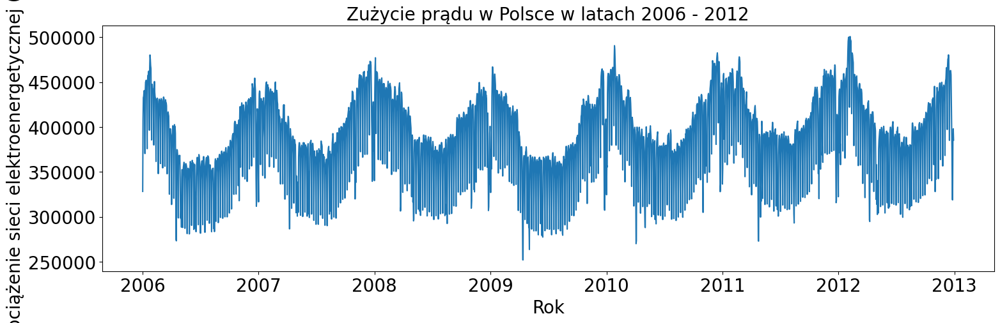

In [39]:
plt.figure(figsize=(18,5))
plt.plot(trainPL['load'])
plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
plt.xlabel("Rok", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Zużycie prądu w Polsce w latach 2006 - 2012',fontsize=20)

Text(0.5, 1.0, 'Zużycie prądu w Niemczech w latach 2006 - 2012')

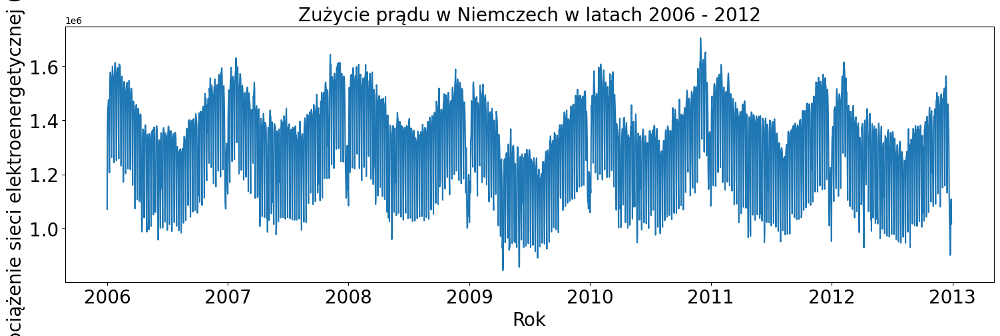

In [40]:
plt.figure(figsize=(18,5))
plt.plot(trainDE['load'])
plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
plt.xlabel("Rok", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Zużycie prądu w Niemczech w latach 2006 - 2012',fontsize=20)

Text(0.5, 1.0, 'Zużycie prądu we Włoszech w latach 2006 - 2012')

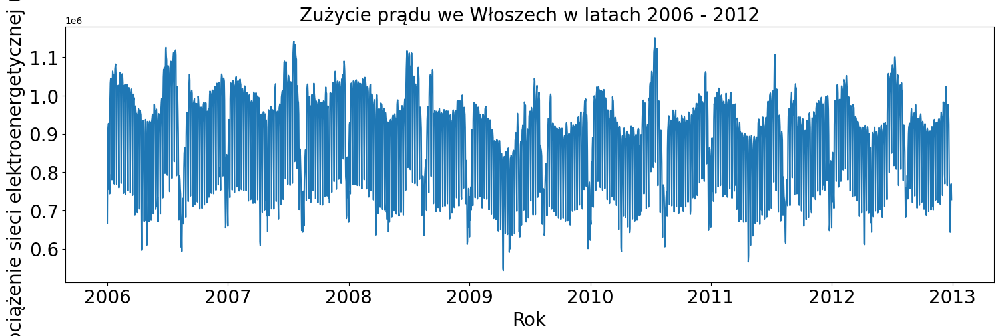

In [41]:
plt.figure(figsize=(18,5))
plt.plot(trainIT['load'])
plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
plt.xlabel("Rok", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.title('Zużycie prądu we Włoszech w latach 2006 - 2012',fontsize=20)

In [42]:
len(trainPL['load'])

2555

In [43]:
len(testPL['load'])

1097

In [44]:
trainPL[['load']]

,load
date,
2006-01-01,328276.0
2006-01-02,408152.0
2006-01-03,432641.0
2006-01-04,434236.0
2006-01-05,439291.0
...,...
2012-12-25,319182.0
2012-12-26,318840.0
2012-12-27,387642.0


# Model & helper functions

In [45]:
# n - liczba dni w jednej sekwencji
def seq(x, y, seq_size=1):
    x_values = []
    y_values = []
    for i in range(len(x)-n):
        x_values.append(x[i:(i+n)])
        y_values.append(y[i+n])
    return np.array(x_values), np.array(y_values)

In [46]:
def me(y_test, y_pred):
    y_test, y_pred = np.array(y_test), np.array(y_pred)
    return np.mean(y_test - y_pred)

def mae(y_test, y_pred):
    y_test, y_pred = np.array(y_test), np.array(y_pred)
    return np.mean(np.abs(y_test - y_pred))

def mape(y_test, y_pred):
    y_test, y_pred = np.array(y_test), np.array(y_pred)
    return np.mean(np.abs((y_test - y_pred)/y_test))

def predict(model, x_test, country):
    best_pred = model.predict(x_test)
    if country == 'PL':
      best_pred_destandardized = scalerPL.inverse_transform(best_pred)
    elif country == 'IT':
      best_pred_destandardized = scalerIT.inverse_transform(best_pred)
    else:
      best_pred_destandardized = scalerDE.inverse_transform(best_pred)
    return best_pred_destandardized

def visualize(best_pred_destandardized, mLSTM, country, training_history=None):

  if  training_history is not None:
    # plot training metrics
    plt.plot(training_history.history['loss'], label='Training loss')
    plt.plot(training_history.history['val_loss'], label='Validation loss')
    plt.legend()

  # Wizualizacja na zbiorze testowym
  # Miejsce na dane
  test_predictions_df = pd.DataFrame({"load":best_pred_destandardized.reshape(-1), "date":testPL.iloc[n:,:].reset_index()["date"]})
  test_predictions_df = test_predictions_df.set_index('date')

  if country == 'PL':
    y_test_df = testPL[['load']].iloc[n:,:]
  elif country == 'IT':
    y_test_df = testIT[['load']].iloc[n:,:]
  elif country == "DE":
    y_test_df = testDE[['load']].iloc[n:,:]
  else:
    raise Exception

  if country == 'PL':
    country_name_full = "w Polsce"
  elif country == 'IT':
    country_name_full = "we Włoszech"
  elif country == "DE":
    country_name_full = "w Niemczech"
  else:
    raise Exception


  # plot
  plt.figure(figsize=(16,10))
  plt.plot(test_predictions_df[0:508],label='predykcje')
  plt.plot(y_test_df[0:508],'g',label='wartość rzeczywista')
  plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
  plt.title(f'Zużycie prądu {country_name_full}',fontsize=20)
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.legend(fontsize=20)
  plt.show()

  # plot
  plt.figure(figsize=(16,10))
  plt.plot(test_predictions_df[508:],label='predykcje')
  plt.plot(y_test_df[508:],'g',label='wartość rzeczywista')
  plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
  plt.title(f'Zużycie prądu {country_name_full}',fontsize=20)
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.legend(fontsize=20)
  plt.show()

  # plot
  plt.figure(figsize=(16,10))
  plt.plot(test_predictions_df[-50:],label='predykcje')
  plt.plot(y_test_df[-50:],'g',label='wartość rzeczywista')
  plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
  plt.title(f'Zużycie prądu {country_name_full}',fontsize=20)
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.legend(fontsize=20)
  plt.show()

def create_LSTM_model(params):
    n_lay = params.Int("n_lay", min_value=1, max_value=5, step=1)
    n_neurons = params.Int("n_neurons", min_value=10, max_value=120, step=4)

    model=Sequential()
    for i in range(n_lay - 1):
        model.add(LSTM(n_neurons*(n_lay-i),return_sequences=True))
    model.add(LSTM(n_neurons))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error',optimizer=tf.keras.optimizers.Adam(), metrics=["mse", tf.keras.metrics.RootMeanSquaredError()])
    return model

def save_results(output_dir:str, name:str, results_dict:dict):
    # saving model
    results_dict["model"].save(os.path.join(output_dir, name, "model"))
    # extracting best HP
    n_lay = results_dict["hyperparemeters"].get("n_lay")
    n_neurons = results_dict["hyperparemeters"].get("n_neurons")

    to_be_dumped_dict = {"n_lay":n_lay,
                         "n_neurons": n_neurons,
                         "rmse": results_dict["rmse"],
                        "mse": results_dict["mse"],
                        "me_err":results_dict["me_err"],
                        "mae_err":results_dict["mae_err"],
                        "mape_err":results_dict["mape_err"],
                        "vecRMSE":results_dict["vecRMSE"].tolist(),
                        **(results_dict["training_history"].history)}

    import json

    with open(os.path.join(output_dir, name, 'data.json'), 'w') as fp:
        json.dump(to_be_dumped_dict, fp)




def train_loop(n, n_trials, country):
    model_type = "LSTM"

    if country == 'PL':
      x_train, y_train = seq(train_standardizedPL, train_standardizedPL, n)
      x_test, y_test = seq(test_standardizedPL, test_standardizedPL, n)
    elif country == 'IT':
      x_train, y_train = seq(train_standardizedIT, train_standardizedIT, n)
      x_test, y_test = seq(test_standardizedIT, test_standardizedIT, n)
    else:
      x_train, y_train = seq(train_standardizedDE, train_standardizedDE, n)
      x_test, y_test = seq(test_standardizedDE, test_standardizedDE, n)


    es = tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)

    tuner = kt.BayesianOptimization(
      create_LSTM_model,
      objective="val_loss",
      max_trials=n_trials,
      directory='drive/MyDrive/praca_magisterska/wyniki',
      overwrite=True,
      project_name="tuner")


    tuner.search(
        x_train, y_train,
        batch_size=32,
        validation_split=0.1,
        callbacks=[es],
        epochs=1000)


    # grab the best hyperparameters
    bestHP = tuner.get_best_hyperparameters(num_trials=n_trials)[0]
    print("[INFO] optimal number of model layers: {}".format(
    bestHP.get("n_lay")))
    print("[INFO] optimal number of *neuron (multiply): {}".format(
    bestHP.get("n_neurons")))

    print("[INFO] training the best model...")
    mLSTM = tuner.hypermodel.build(bestHP)
    training_history = mLSTM.fit(x_train, y_train,
    batch_size=32,
    validation_split=0.1, epochs=1000, callbacks=[es])

    # predictions
    best_pred_destandardized = predict(mLSTM, x_test, country=country)

    # Wizualizacja wybranego modelu
    visualize(best_pred_destandardized, mLSTM, training_history=training_history, country=country)


    if country == 'PL':
      test_dataset = testPL["load"]
    elif country == 'IT':
      test_dataset = testIT["load"]
    else:
      test_dataset = testDE["load"]

    rmse = []
    mse = []
    me_err = []
    mae_err = []
    mape_err = []

    horizons = [1,7,30,365,len(test_dataset[n:])]
    for horizon in horizons:
        # rmse = mean_squared_error(testPL["load"][n:], best_pred_destandardized[:], squared=True)
        rmse.append(mean_squared_error(test_dataset[n:n+horizon], best_pred_destandardized[:horizon], squared=True))
        mse.append(mean_squared_error(test_dataset[n:n+horizon], best_pred_destandardized[:horizon]))
        me_err.append(me(test_dataset[n:n+horizon], best_pred_destandardized[:horizon]))
        mae_err.append(mae(test_dataset[n:n+horizon], best_pred_destandardized[:horizon]))
        mape_err.append(mape(test_dataset[n:n+horizon], best_pred_destandardized[:horizon]))

    vecRMSE = np.array([(test_dataset.values[i+n] - best_pred_destandardized[i]) for i in range(len(test_dataset)-n)]).reshape(-1)

    save_results(output_dir = "drive/MyDrive/praca_magisterska/results",name = f"n_{n}_n_trials_{n_trials}_country_{country}_model_type_{model_type}", results_dict = {
        "model":mLSTM,
        "hyperparemeters": bestHP,
        "rmse": rmse,
        "mse": mse,
        "me_err":me_err,
        "mae_err":mae_err,
        "mape_err":mape_err,
        "vecRMSE":vecRMSE,
        "training_history":training_history
    })

    return mLSTM, bestHP, rmse, mse, me_err, mae_err, mape_err, vecRMSE, training_history

# Dummy models

## Powtarzający ostatnią predykcję

In [47]:
class DummyRNNModel1(tf.keras.Model):
  def predict(self, input):

    return input[:, -1]

In [48]:
n = 7
x_train, y_train = seq(train_standardizedPL, train_standardizedPL, n)
x_test, y_test = seq(test_standardizedPL, test_standardizedPL, n)

In [49]:
dummy_model = DummyRNNModel1()

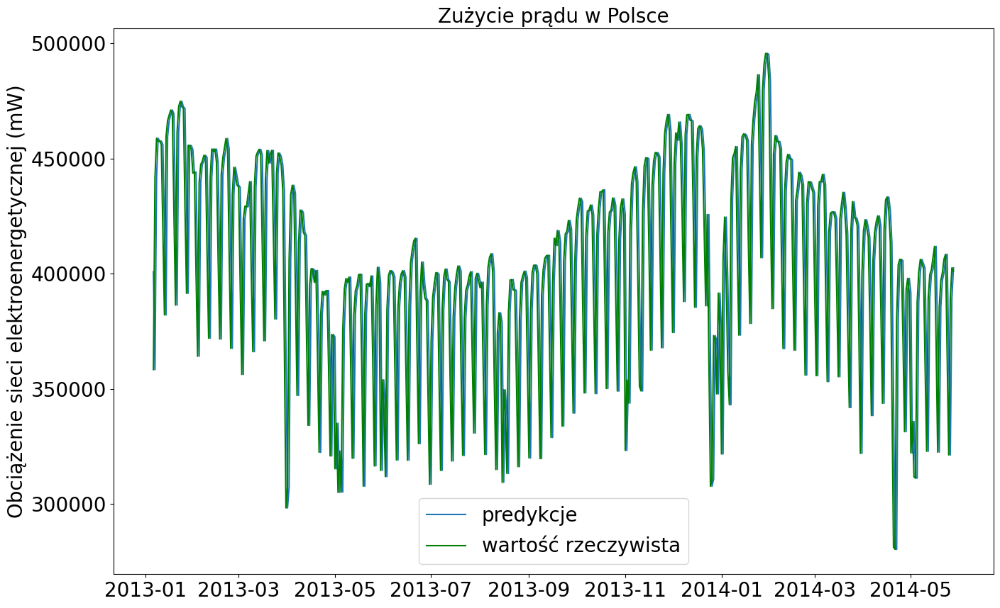

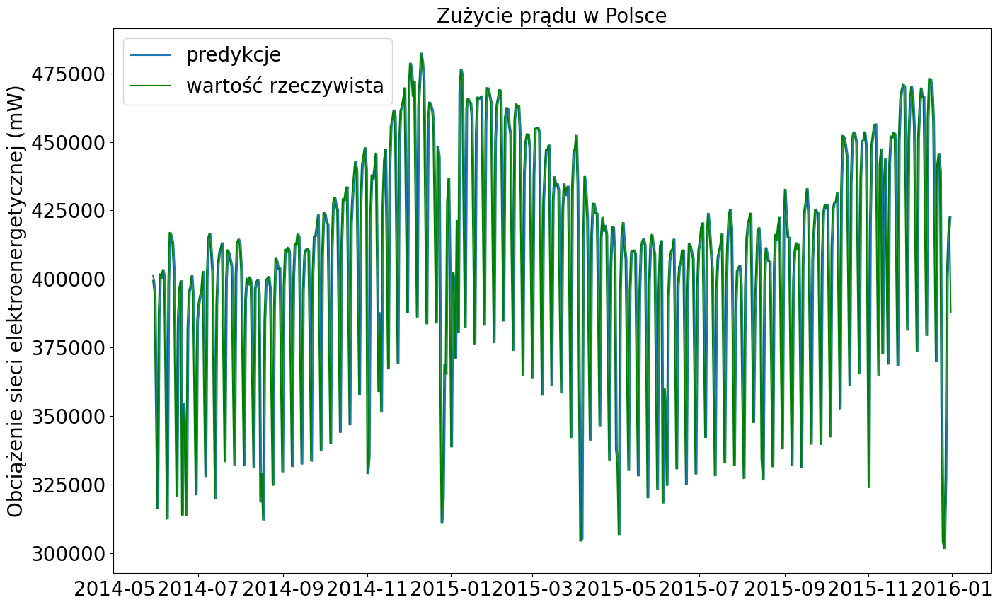

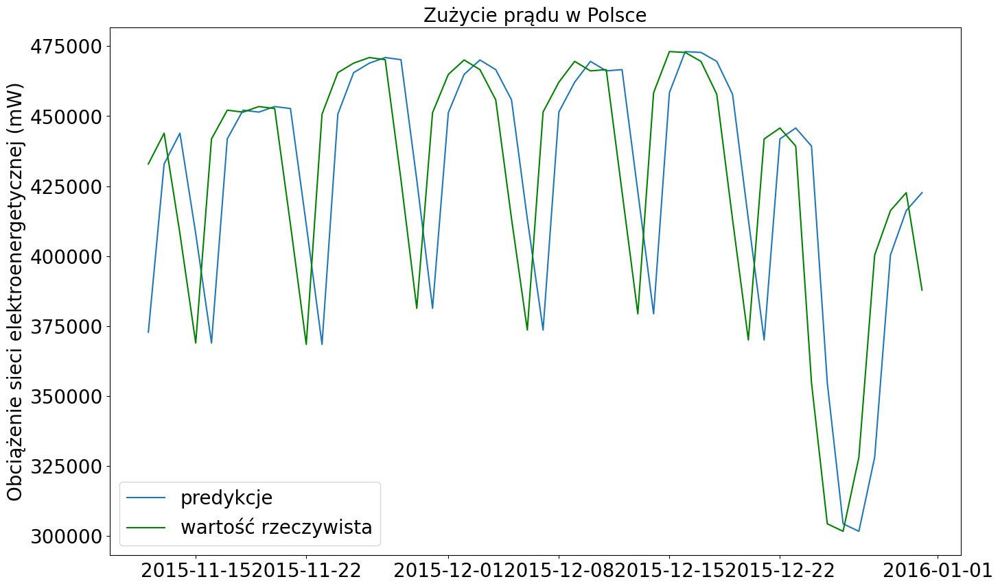

In [50]:
# predictions
best_pred_destandardized = predict(dummy_model, x_test, country='PL')

# Wizualizacja wybranego modelu
visualize(best_pred_destandardized, dummy_model, training_history=None, country='PL')

#rmse_dummy_1 = mean_squared_error(testPL["load"][n:], best_pred_destandardized[:], squared=True)
horizons = [1,7,30,365,len(testPL["load"][n:])]
rmse_dummy1 = []
#mse_dummy1 = []
me_dummy1 = []
mae_dummy1 = []
mape_dummy1 = []

for horizon in horizons:
    rmse_dummy1.append(mean_squared_error(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon], squared=True))
    #mse_dummy1.append(mean_squared_error(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon]), squared=False)
    me_dummy1.append(me(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon]))
    mae_dummy1.append(mae(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon]))
    mape_dummy1.append(mape(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon]))


In [51]:
rmse_dummy1, me_dummy1, mae_dummy1, mape_dummy1

([1807185121.0,
  1494622283.0,
  1447636649.7,
  1284746134.9863014,
  1360892106.4091742],
 [-42511.0,
  2510.714285714286,
  1291.0333333333333,
  -118.56438356164384,
  -11.944954128440367],
 [42511.0,
  34045.448979591834,
  36060.666666666664,
  47688.57309063614,
  46703.566714922985],
 [0.11862486570954195,
  0.08223059013321729,
  0.08491217489374313,
  0.12246465300425206,
  0.11887901789690798])

## Powtarzający predykcję z przed tygodnia

In [52]:
class DummyRNNModel2(tf.keras.Model):
  def predict(self, input):

    return input[:, -7]

In [53]:
dummy_model_2 = DummyRNNModel2()

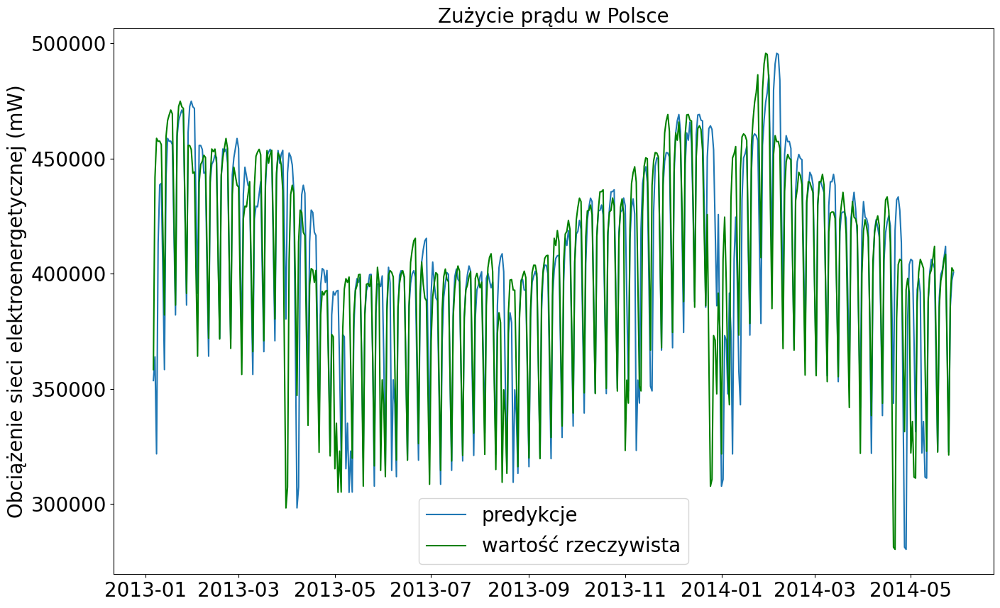

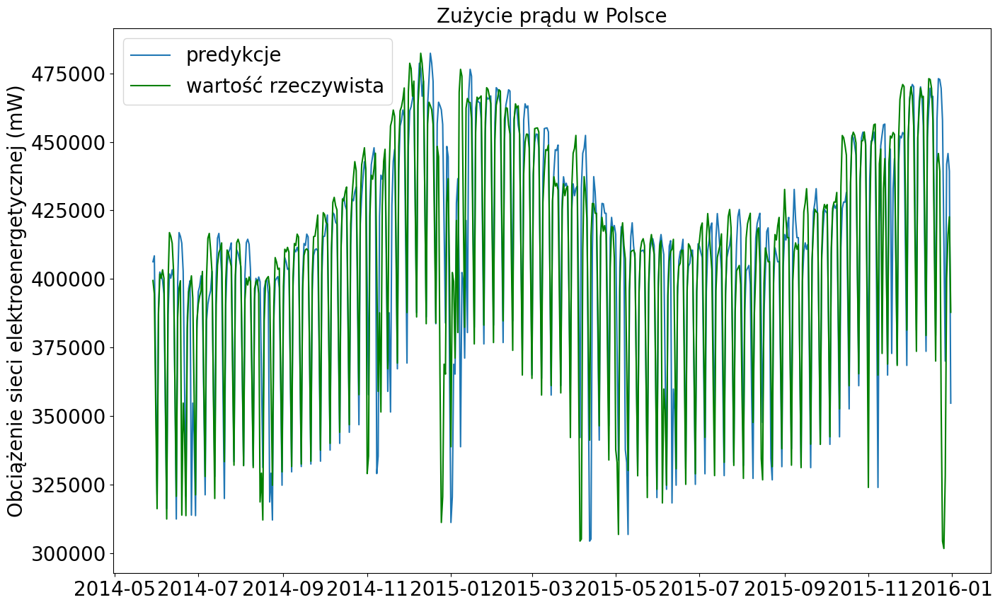

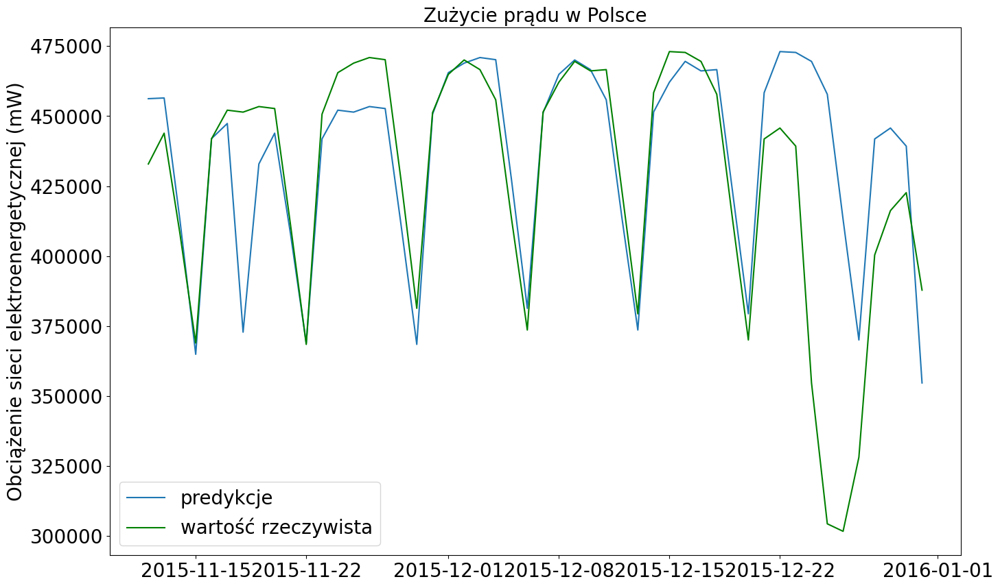

In [54]:
# predictions
best_pred_destandardized = predict(dummy_model_2, x_test, country="PL")

# Wizualizacja wybranego modelu
visualize(best_pred_destandardized, dummy_model_2, training_history=None, country="PL")

rmse_dummy2 = []
#mse_dummy2 = []
me_dummy2 = []
mae_dummy2 = []
mape_dummy2 = []

for horizon in horizons:
    rmse_dummy2.append(mean_squared_error(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon], squared=True))
    #mse_dummy2.append(mean_squared_error(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon]))
    me_dummy2.append(me(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon]))
    mae_dummy2.append(mae(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon]))
    mape_dummy2.append(mape(testPL["load"][n:n+horizon], best_pred_destandardized[:horizon]))

In [55]:
rmse_dummy2, me_dummy2, mae_dummy2, mape_dummy2

([22724289.0,
  3963365221.714286,
  1117609734.7666667,
  840542200.9424658,
  737801643.9110092],
 [4767.0,
  45302.57142857143,
  9016.033333333333,
  -157.57808219178082,
  -155.76605504587155],
 [4767.0,
  57746.36734693877,
  41117.79555555555,
  47812.5507074498,
  46634.83511320596],
 [0.01330208028127747,
  0.1317358300364943,
  0.09572832600960815,
  0.12278424569406646,
  0.11872437278080092])

## Porównanie

In [56]:
diff_dummy = np.array(rmse_dummy1) - np.array(rmse_dummy2)
diff_dummy

array([ 1.78446083e+09, -2.46874294e+09,  3.30026915e+08,  4.44203934e+08,
        6.23090462e+08])

# Trening

In [57]:
############################################# LSTM #########################################################

## n = 7, 14, 21, 28

In [58]:
n_trials = 30

Trial 30 Complete [00h 01m 26s]
val_loss: 0.08394816517829895

Best val_loss So Far: 0.061624277383089066
Total elapsed time: 00h 36m 59s
[INFO] optimal number of model layers: 4
[INFO] optimal number of *neuron (multiply): 110
[INFO] training the best model...
Epoch 1/1000
72/72 [==============================] - 12s 31ms/step - loss: 0.4443 - mse: 0.4443 - root_mean_squared_error: 0.6666 - val_loss: 0.3933 - val_mse: 0.3933 - val_root_mean_squared_error: 0.6271
Epoch 2/1000
72/72 [==============================] - 1s 10ms/step - loss: 0.3638 - mse: 0.3638 - root_mean_squared_error: 0.6032 - val_loss: 0.3563 - val_mse: 0.3563 - val_root_mean_squared_error: 0.5969
Epoch 3/1000
72/72 [==============================] - 1s 10ms/step - loss: 0.3347 - mse: 0.3347 - root_mean_squared_error: 0.5785 - val_loss: 0.3471 - val_mse: 0.3471 - val_root_mean_squared_error: 0.5892
Epoch 4/1000
72/72 [==============================] - 1s 9ms/step - loss: 0.3345 - mse: 0.3345 - root_mean_squared_error: 

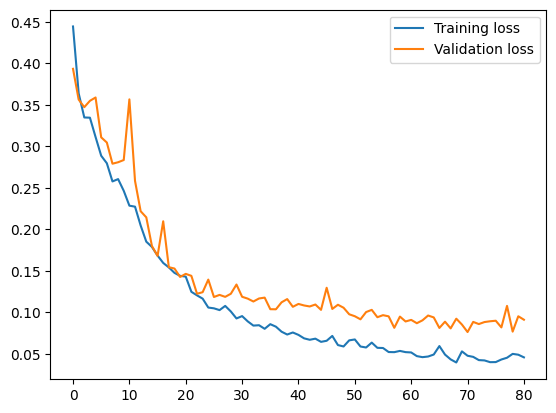

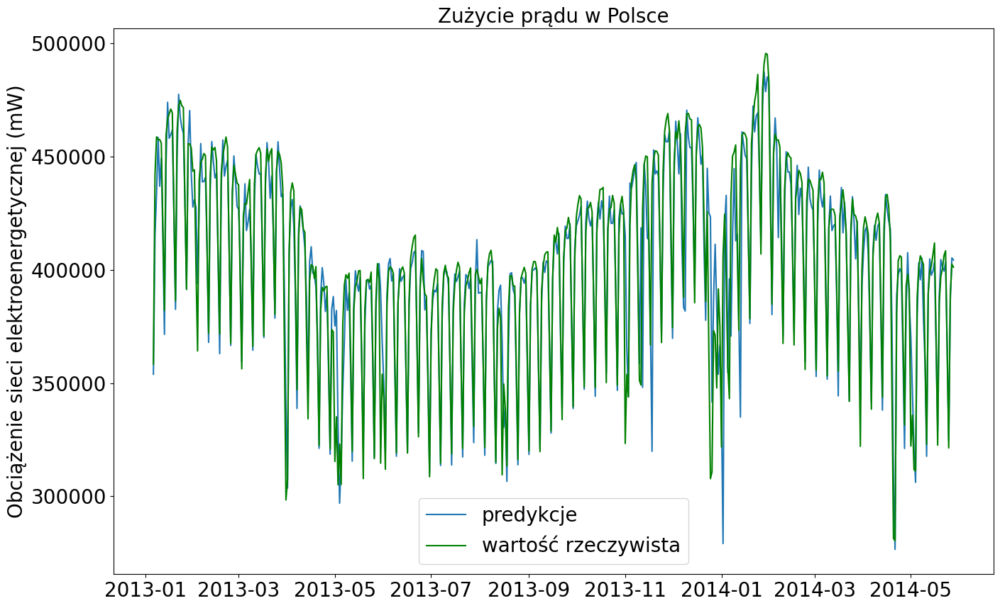

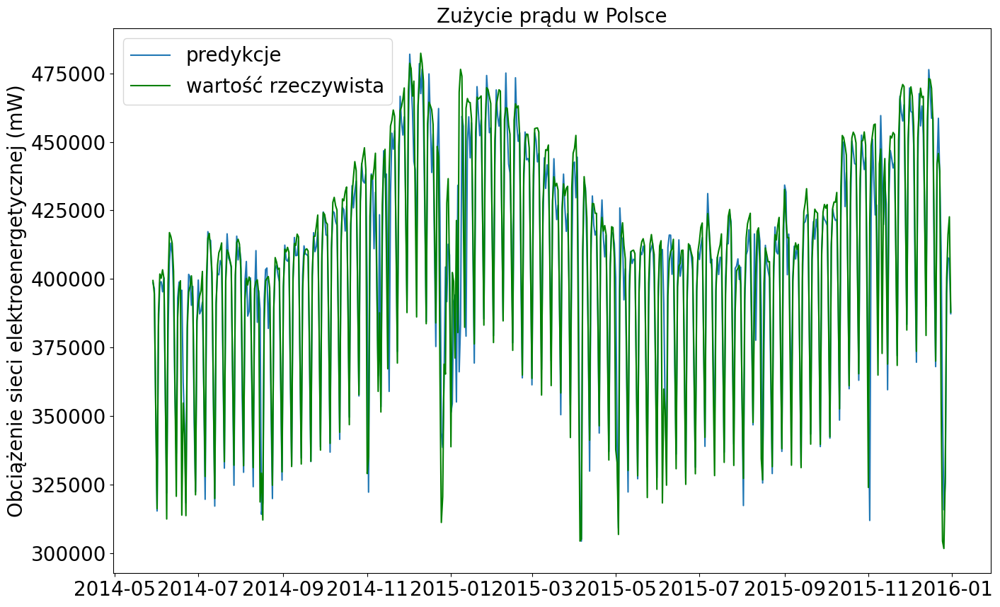

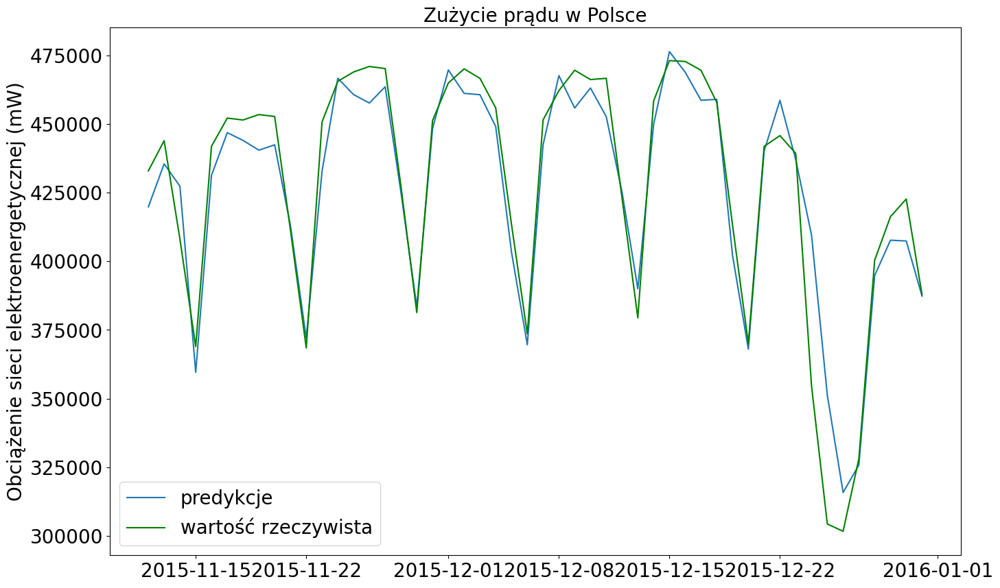

In [59]:
n = 7
#mLSTM_7, bestHP_7, rmse_7 = train_loop(n, n_trials=n_trials)
LSTM_tuple_7 = train_loop(n, n_trials, country='PL')

In [60]:
LSTM_tuple_7

(<keras.src.engine.sequential.Sequential at 0x7edbb74f7910>,
 [20307415.640625,
  263709902.89592633,
  181557163.46940103,
  333654051.49902344,
  280399940.3158642],
 [20307415.640625,
  263709902.89592633,
  181557163.46940103,
  333654051.49902344,
  280399940.3158642],
 [4506.375,
  12249.017857142857,
  5064.233333333334,
  1349.0678938356164,
  1900.3627006880733],
 [4506.375,
  36414.42984693877,
  35473.50236111111,
  46009.20274371364,
  44813.23234097509],
 [0.012574818969486418,
  0.08632795274978472,
  0.08307264804148588,
  0.11803575463611508,
  0.11389335479360688],
 array([ 4506.375  , 26794.75   , 25057.562  , ...,  8574.156  ,
        15281.156  ,   534.90625], dtype=float32),
 <keras.src.callbacks.History at 0x7edbbbb44100>)

Trial 30 Complete [00h 00m 54s]
val_loss: 0.10235637426376343

Best val_loss So Far: 0.05902036651968956
Total elapsed time: 00h 36m 44s
[INFO] optimal number of model layers: 4
[INFO] optimal number of *neuron (multiply): 94
[INFO] training the best model...
Epoch 1/1000
72/72 [==============================] - 12s 41ms/step - loss: 0.6120 - mse: 0.6120 - root_mean_squared_error: 0.7823 - val_loss: 0.5734 - val_mse: 0.5734 - val_root_mean_squared_error: 0.7572
Epoch 2/1000
72/72 [==============================] - 1s 14ms/step - loss: 0.5771 - mse: 0.5771 - root_mean_squared_error: 0.7597 - val_loss: 0.5686 - val_mse: 0.5686 - val_root_mean_squared_error: 0.7541
Epoch 3/1000
72/72 [==============================] - 1s 12ms/step - loss: 0.5601 - mse: 0.5601 - root_mean_squared_error: 0.7484 - val_loss: 0.4792 - val_mse: 0.4792 - val_root_mean_squared_error: 0.6923
Epoch 4/1000
72/72 [==============================] - 1s 10ms/step - loss: 0.4582 - mse: 0.4582 - root_mean_squared_error: 0

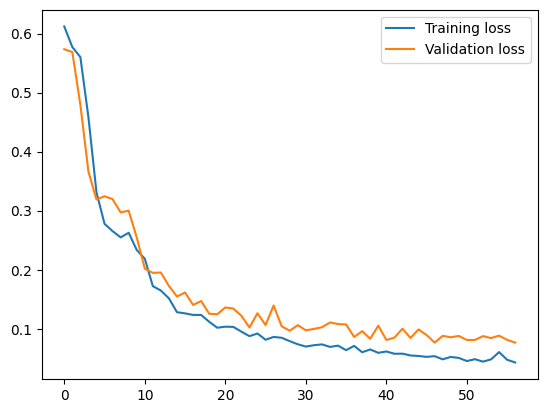

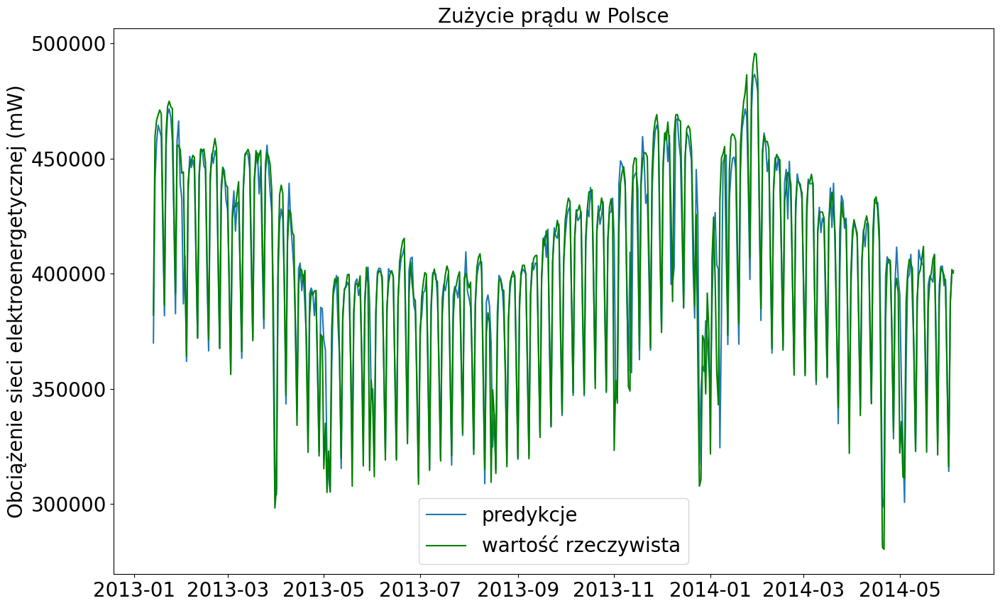

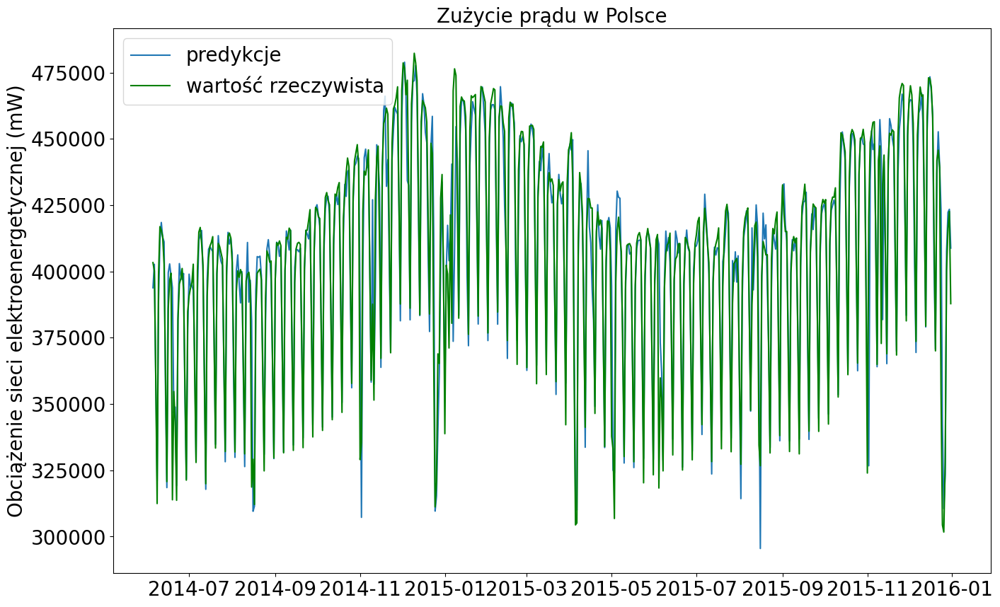

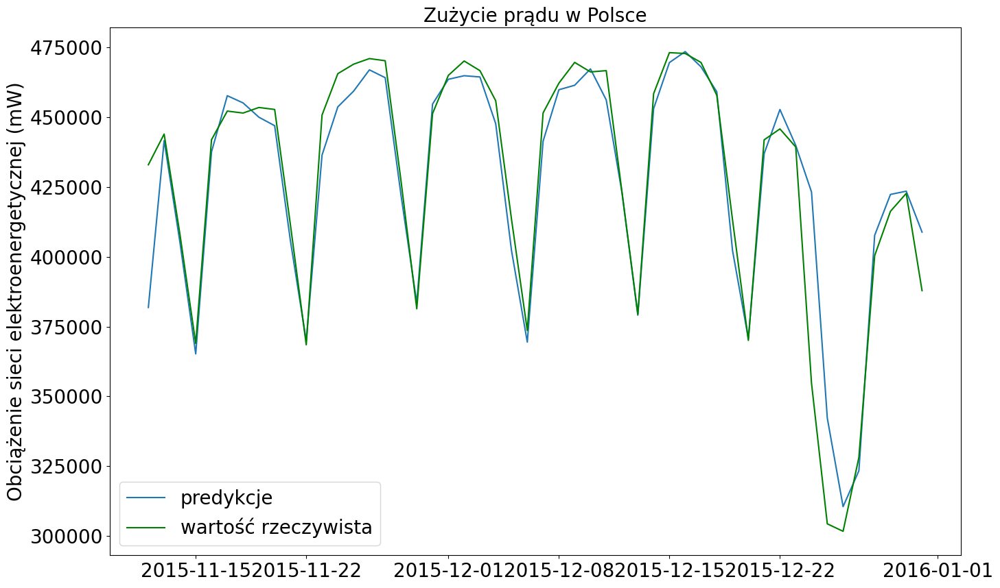

In [61]:
n = 14
# mLSTM_14, bestHP_14, rmse_14 = train_loop(n, n_trials=n_trials)
LSTM_tuple_14 = train_loop(n, n_trials=n_trials, country = "PL")

In [62]:
LSTM_tuple_14

(<keras.src.engine.sequential.Sequential at 0x7edbb7b42cb0>,
 [146331360.5625,
  126023044.12304688,
  172160314.2019857,
  239405274.47419736,
  188875779.20031795],
 [146331360.5625,
  126023044.12304688,
  172160314.2019857,
  239405274.47419736,
  188875779.20031795],
 [12096.75, 10406.0, 6726.832291666667, 651.4827054794521, 599.6458621883656],
 [12096.75,
  33495.61224489796,
  36021.346180555556,
  45797.42408613248,
  45061.35303087611],
 [0.031660420123639677,
  0.07665285552648607,
  0.08388328335186508,
  0.1176303272234057,
  0.11474985944033674],
 array([ 12096.75   ,  19312.094  ,   9612.781  , ...,  -6043.9688 ,
          -796.21875, -20955.094  ], dtype=float32),
 <keras.src.callbacks.History at 0x7edbb9214c40>)

Trial 30 Complete [00h 01m 10s]
val_loss: 0.0676591545343399

Best val_loss So Far: 0.061617281287908554
Total elapsed time: 00h 37m 06s
[INFO] optimal number of model layers: 5
[INFO] optimal number of *neuron (multiply): 86
[INFO] training the best model...
Epoch 1/1000
72/72 [==============================] - 15s 41ms/step - loss: 0.6664 - mse: 0.6664 - root_mean_squared_error: 0.8163 - val_loss: 0.6212 - val_mse: 0.6212 - val_root_mean_squared_error: 0.7881
Epoch 2/1000
72/72 [==============================] - 1s 15ms/step - loss: 0.6175 - mse: 0.6175 - root_mean_squared_error: 0.7858 - val_loss: 0.5667 - val_mse: 0.5667 - val_root_mean_squared_error: 0.7528
Epoch 3/1000
72/72 [==============================] - 1s 13ms/step - loss: 0.5932 - mse: 0.5932 - root_mean_squared_error: 0.7702 - val_loss: 0.5758 - val_mse: 0.5758 - val_root_mean_squared_error: 0.7588
Epoch 4/1000
72/72 [==============================] - 1s 13ms/step - loss: 0.5278 - mse: 0.5278 - root_mean_squared_error: 0

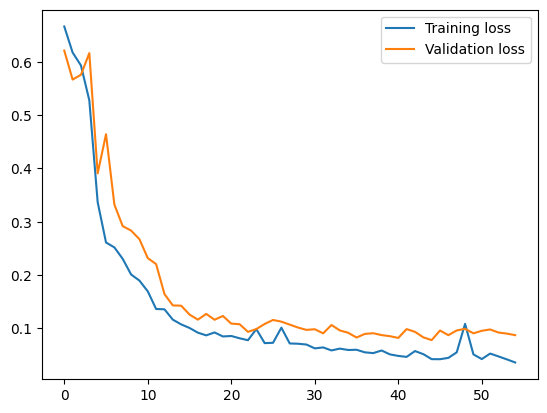

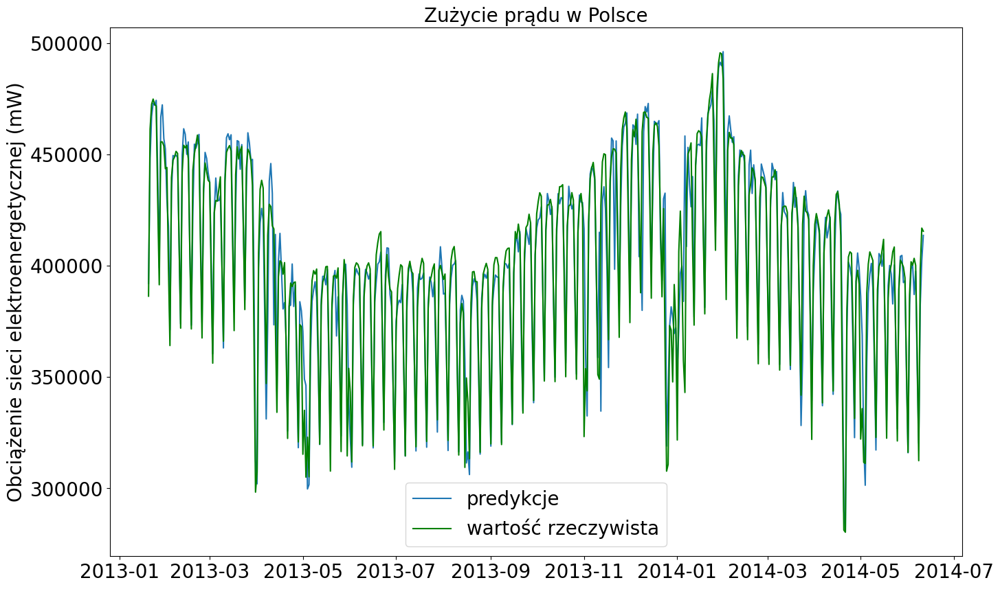

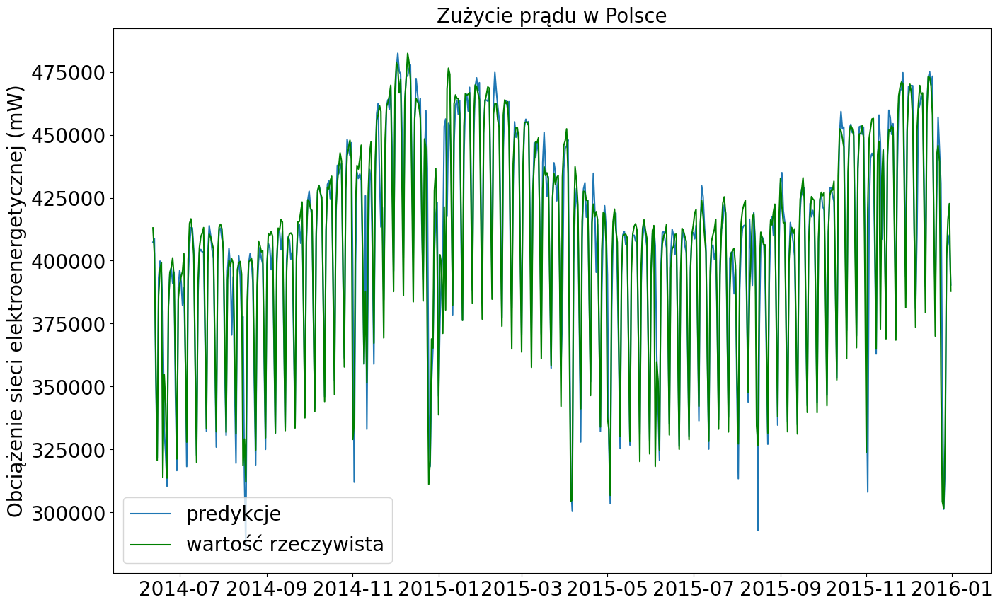

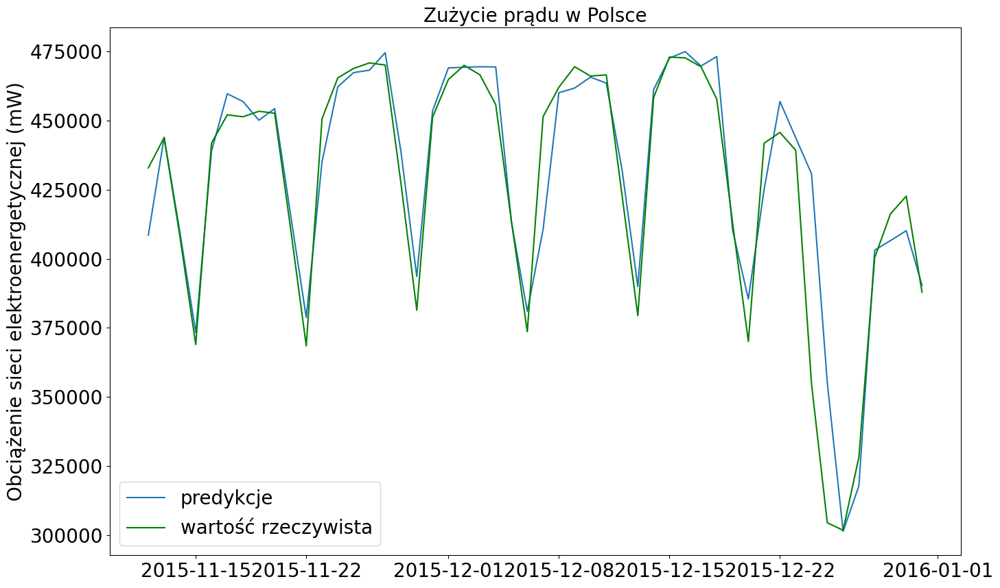

In [63]:
n = 21
# mLSTM_21, bestHP_21, rmse_21 = train_loop(n, n_trials=n_trials)
LSTM_tuple_21 = train_loop(n, n_trials=n_trials, country = "PL")

In [64]:
LSTM_tuple_21

(<keras.src.engine.sequential.Sequential at 0x7edbb59703d0>,
 [32741999.25390625,
  57677001.47000558,
  71055443.88105468,
  267668873.17175192,
  213539011.94872865],
 [32741999.25390625,
  57677001.47000558,
  71055443.88105468,
  267668873.17175192,
  213539011.94872865],
 [-5722.0625,
  -85.48660714285714,
  -2049.1604166666666,
  464.866095890411,
  472.0630808550186],
 [5722.0625,
  29194.70854591837,
  33682.11256944444,
  46812.53856445862,
  46227.88374591674],
 [0.01481068184818311,
  0.06743962568952064,
  0.07998655801703596,
  0.12023168469422002,
  0.11769109296987679],
 array([-5722.0625, 12872.906 ,  5416.5312, ...,  9658.1875, 12503.219 ,
        -2509.2188], dtype=float32),
 <keras.src.callbacks.History at 0x7edb0efc47f0>)

Trial 30 Complete [00h 00m 45s]
val_loss: 0.0917908102273941

Best val_loss So Far: 0.056810591369867325
Total elapsed time: 00h 37m 08s
[INFO] optimal number of model layers: 2
[INFO] optimal number of *neuron (multiply): 62
[INFO] training the best model...
Epoch 1/1000
72/72 [==============================] - 7s 19ms/step - loss: 0.6358 - mse: 0.6358 - root_mean_squared_error: 0.7974 - val_loss: 0.6050 - val_mse: 0.6050 - val_root_mean_squared_error: 0.7778
Epoch 2/1000
72/72 [==============================] - 1s 7ms/step - loss: 0.5994 - mse: 0.5994 - root_mean_squared_error: 0.7742 - val_loss: 0.5909 - val_mse: 0.5909 - val_root_mean_squared_error: 0.7687
Epoch 3/1000
72/72 [==============================] - 1s 8ms/step - loss: 0.5632 - mse: 0.5632 - root_mean_squared_error: 0.7505 - val_loss: 0.4981 - val_mse: 0.4981 - val_root_mean_squared_error: 0.7057
Epoch 4/1000
72/72 [==============================] - 1s 8ms/step - loss: 0.2737 - mse: 0.2737 - root_mean_squared_error: 0.523

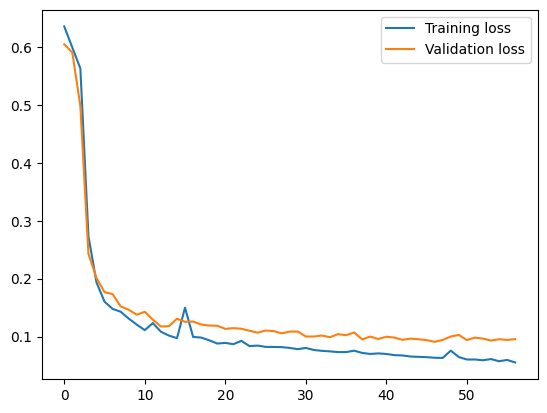

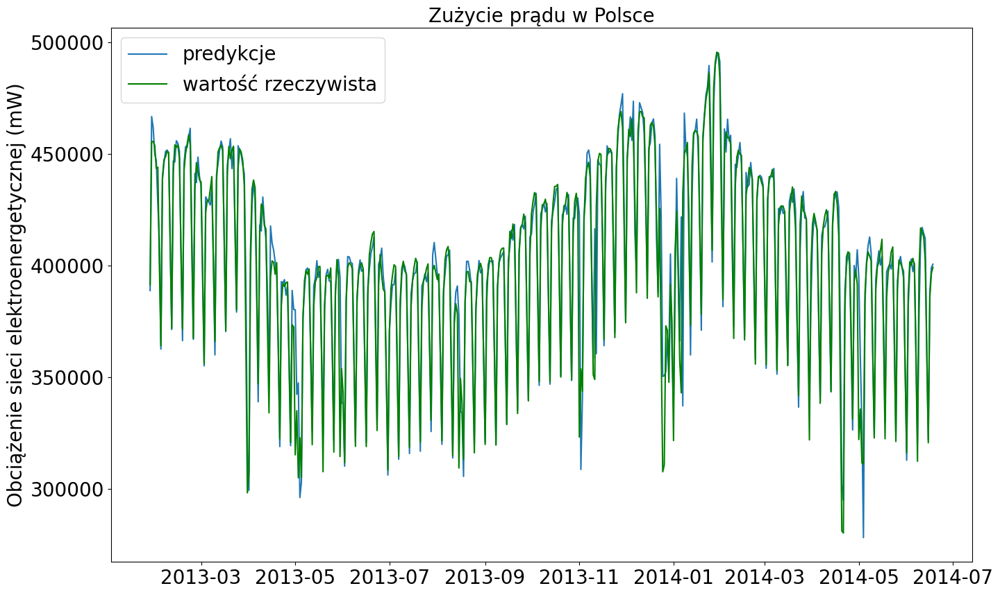

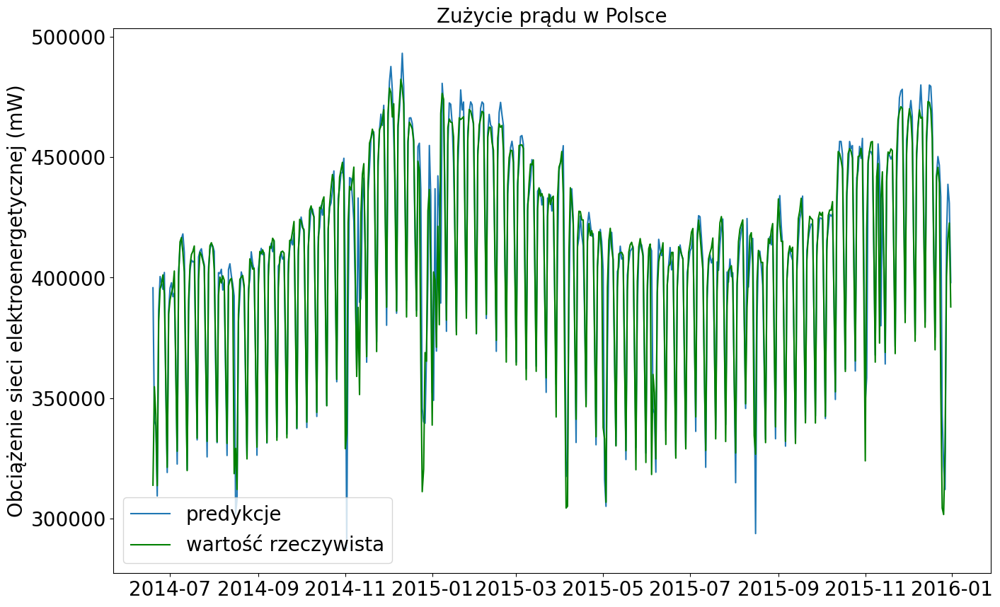

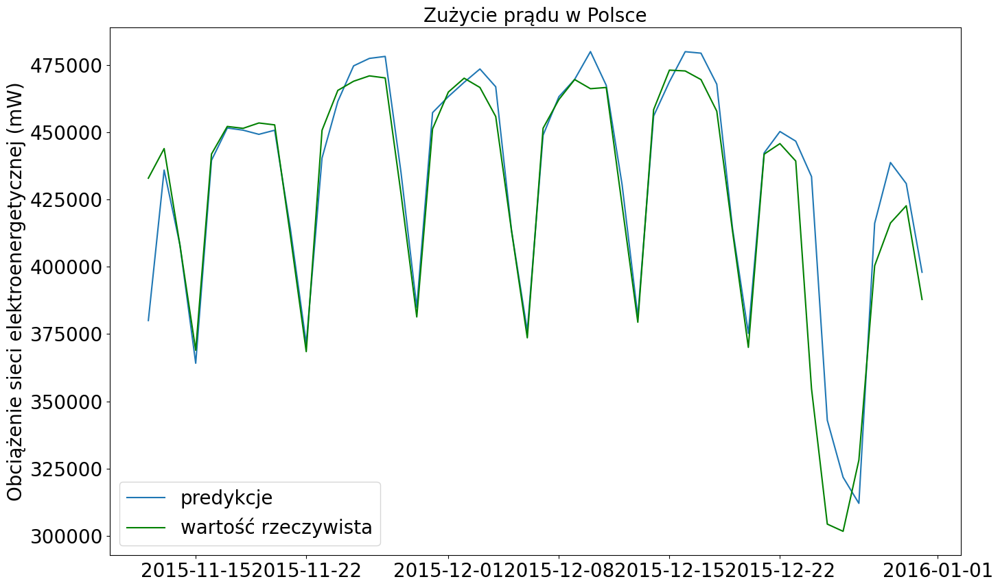

In [66]:
n = 28
# mLSTM_28, bestHP_28, rmse_28 = train_loop(n, n_trials=n_trials)
LSTM_tuple_28 = train_loop(n, n_trials=n_trials, country = "PL")

In [67]:
LSTM_tuple_28

(<keras.src.engine.sequential.Sequential at 0x7edb1048ce20>,
 [6656883.7587890625,
  83665562.66838728,
  29437484.321744792,
  206464645.76298696,
  181298735.29423308],
 [6656883.7587890625,
  83665562.66838728,
  29437484.321744792,
  206464645.76298696,
  181298735.29423308],
 [2580.09375,
  -1338.888392857143,
  -1026.2895833333334,
  -1774.0518835616438,
  -1483.9717609915808],
 [2580.09375,
  28651.82844387755,
  31789.65611111111,
  46842.04910067555,
  45970.326524804834],
 [0.006590765982665382,
  0.06729917302598194,
  0.07659186262357336,
  0.12069415323837213,
  0.11746386539714793],
 array([  2580.0938, -11134.9375,  -6261.75  , ..., -22477.375 ,
         -8230.9375, -10113.0625], dtype=float32),
 <keras.src.callbacks.History at 0x7edb11a388b0>)

# GRU

## Funkcje

In [69]:
def visualize(best_pred_destandardized, mGRU, country, training_history=None):

  if  training_history is not None:
    # plot training metrics
    plt.plot(training_history.history['loss'], label='Training loss')
    plt.plot(training_history.history['val_loss'], label='Validation loss')
    plt.legend()

  # Wizualizacja na zbiorze testowym
  # Miejsce na dane
  test_predictions_df = pd.DataFrame({"load":best_pred_destandardized.reshape(-1), "date":testPL.iloc[n:,:].reset_index()["date"]})
  test_predictions_df = test_predictions_df.set_index('date')

  if country == 'PL':
    y_test_df = testPL[['load']].iloc[n:,:]
  elif country == 'IT':
    y_test_df = testIT[['load']].iloc[n:,:]
  elif country == "DE":
    y_test_df = testDE[['load']].iloc[n:,:]
  else:
    raise Exception

  if country == 'PL':
    country_name_full = "w Polsce"
  elif country == 'IT':
    country_name_full = "we Włoszech"
  elif country == "DE":
    country_name_full = "w Niemczech"
  else:
    raise Exception


  # plot
  plt.figure(figsize=(16,10))
  plt.plot(test_predictions_df[0:508],label='predykcje')
  plt.plot(y_test_df[0:508],'g',label='wartość rzeczywista')
  plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
  plt.title(f'Zużycie prądu {country_name_full}',fontsize=20)
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.legend(fontsize=20)
  plt.show()

  # plot
  plt.figure(figsize=(16,10))
  plt.plot(test_predictions_df[508:],label='predykcje')
  plt.plot(y_test_df[508:],'g',label='wartość rzeczywista')
  plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
  plt.title(f'Zużycie prądu {country_name_full}',fontsize=20)
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.legend(fontsize=20)
  plt.show()

  # plot
  plt.figure(figsize=(16,10))
  plt.plot(test_predictions_df[-50:],label='predykcje')
  plt.plot(y_test_df[-50:],'g',label='wartość rzeczywista')
  plt.ylabel("Obciążenie sieci elektroenergetycznej (mW)", fontsize=20)
  plt.title(f'Zużycie prądu {country_name_full}',fontsize=20)
  plt.xticks(fontsize=20)
  plt.yticks(fontsize=20)
  plt.legend(fontsize=20)
  plt.show()

def create_GRU_model(params):
    n_lay = params.Int("n_lay", min_value=1, max_value=5, step=1)
    n_neurons = params.Int("n_neurons", min_value=10, max_value=120, step=4)

    model=Sequential()
    for i in range(n_lay - 1):
        model.add(GRU(n_neurons*(n_lay-i),return_sequences=True))
    model.add(GRU(n_neurons))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error',optimizer=tf.keras.optimizers.Adam(), metrics=["mse", tf.keras.metrics.RootMeanSquaredError()])
    return model

def save_results(output_dir:str, name:str, results_dict:dict):
    # saving model
    results_dict["model"].save(os.path.join(output_dir, name, "model"))
    # extracting best HP
    n_lay = results_dict["hyperparemeters"].get("n_lay")
    n_neurons = results_dict["hyperparemeters"].get("n_neurons")

    to_be_dumped_dict = {"n_lay":n_lay,
                         "n_neurons": n_neurons,
                         "rmse": results_dict["rmse"],
                        "mse": results_dict["mse"],
                        "me_err":results_dict["me_err"],
                        "mae_err":results_dict["mae_err"],
                        "mape_err":results_dict["mape_err"],
                        "vecRMSE":results_dict["vecRMSE"].tolist(),
                        **(results_dict["training_history"].history)}

    import json

    with open(os.path.join(output_dir, name, 'data.json'), 'w') as fp:
        json.dump(to_be_dumped_dict, fp)




def train_loop(n, n_trials, country):
    model_type = "GRU"

    if country == 'PL':
      x_train, y_train = seq(train_standardizedPL, train_standardizedPL, n)
      x_test, y_test = seq(test_standardizedPL, test_standardizedPL, n)
    elif country == 'IT':
      x_train, y_train = seq(train_standardizedIT, train_standardizedIT, n)
      x_test, y_test = seq(test_standardizedIT, test_standardizedIT, n)
    else:
      x_train, y_train = seq(train_standardizedDE, train_standardizedDE, n)
      x_test, y_test = seq(test_standardizedDE, test_standardizedDE, n)


    es = tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)

    tuner = kt.BayesianOptimization(
      create_GRU_model,
      objective="val_loss",
      max_trials=n_trials,
      directory='drive/MyDrive/praca_magisterska/wyniki',
      overwrite=True,
      project_name="tuner")


    tuner.search(
        x_train, y_train,
        batch_size=32,
        validation_split=0.1,
        callbacks=[es],
        epochs=1000)


    # grab the best hyperparameters
    bestHP = tuner.get_best_hyperparameters(num_trials=n_trials)[0]
    print("[INFO] optimal number of model layers: {}".format(
    bestHP.get("n_lay")))
    print("[INFO] optimal number of *neuron (multiply): {}".format(
    bestHP.get("n_neurons")))

    print("[INFO] training the best model...")
    mGRU = tuner.hypermodel.build(bestHP)
    training_history = mGRU.fit(x_train, y_train,
    batch_size=32,
    validation_split=0.1, epochs=1000, callbacks=[es])

    # predictions
    best_pred_destandardized = predict(mGRU, x_test, country=country)

    # Wizualizacja wybranego modelu
    visualize(best_pred_destandardized, mGRU, training_history=training_history, country=country)


    if country == 'PL':
      test_dataset = testPL["load"]
    elif country == 'IT':
      test_dataset = testIT["load"]
    else:
      test_dataset = testDE["load"]

    rmse = []
    mse = []
    me_err = []
    mae_err = []
    mape_err = []

    horizons = [1,7,30,365,len(test_dataset[n:])]
    for horizon in horizons:
        # rmse = mean_squared_error(testPL["load"][n:], best_pred_destandardized[:], squared=True)
        rmse.append(mean_squared_error(test_dataset[n:n+horizon], best_pred_destandardized[:horizon], squared=True))
        mse.append(mean_squared_error(test_dataset[n:n+horizon], best_pred_destandardized[:horizon]))
        me_err.append(me(test_dataset[n:n+horizon], best_pred_destandardized[:horizon]))
        mae_err.append(mae(test_dataset[n:n+horizon], best_pred_destandardized[:horizon]))
        mape_err.append(mape(test_dataset[n:n+horizon], best_pred_destandardized[:horizon]))

    vecRMSE = np.array([(test_dataset.values[i+n] - best_pred_destandardized[i]) for i in range(len(test_dataset)-n)]).reshape(-1)

    save_results(output_dir = "drive/MyDrive/praca_magisterska/results",name = f"n_{n}_n_trials_{n_trials}_country_{country}_model_type_{model_type}", results_dict = {
        "model":mGRU,
        "hyperparemeters": bestHP,
        "rmse": rmse,
        "mse": mse,
        "me_err":me_err,
        "mae_err":mae_err,
        "mape_err":mape_err,
        "vecRMSE":vecRMSE,
        "training_history":training_history
    })

    return mGRU, bestHP, rmse, mse, me_err, mae_err, mape_err, vecRMSE, training_history

# Trening GRU

In [71]:
n_trials = 30

Trial 30 Complete [00h 01m 31s]
val_loss: 0.07321686297655106

Best val_loss So Far: 0.07302197068929672
Total elapsed time: 00h 37m 45s
[INFO] optimal number of model layers: 5
[INFO] optimal number of *neuron (multiply): 14
[INFO] training the best model...
Epoch 1/1000
72/72 [==============================] - 15s 48ms/step - loss: 0.5208 - mse: 0.5208 - root_mean_squared_error: 0.7216 - val_loss: 0.4172 - val_mse: 0.4172 - val_root_mean_squared_error: 0.6459
Epoch 2/1000
72/72 [==============================] - 1s 11ms/step - loss: 0.3726 - mse: 0.3726 - root_mean_squared_error: 0.6104 - val_loss: 0.3890 - val_mse: 0.3890 - val_root_mean_squared_error: 0.6237
Epoch 3/1000
72/72 [==============================] - 1s 10ms/step - loss: 0.3380 - mse: 0.3380 - root_mean_squared_error: 0.5814 - val_loss: 0.3445 - val_mse: 0.3445 - val_root_mean_squared_error: 0.5870
Epoch 4/1000
72/72 [==============================] - 1s 10ms/step - loss: 0.2957 - mse: 0.2957 - root_mean_squared_error: 0

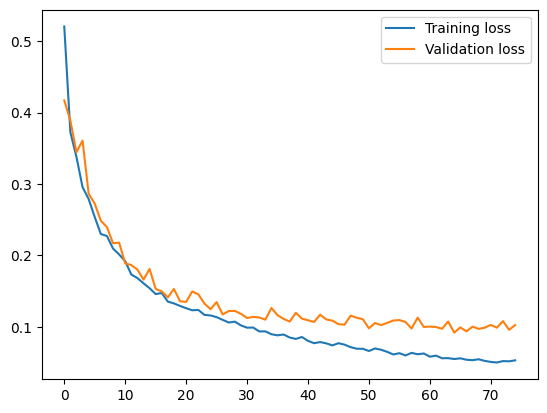

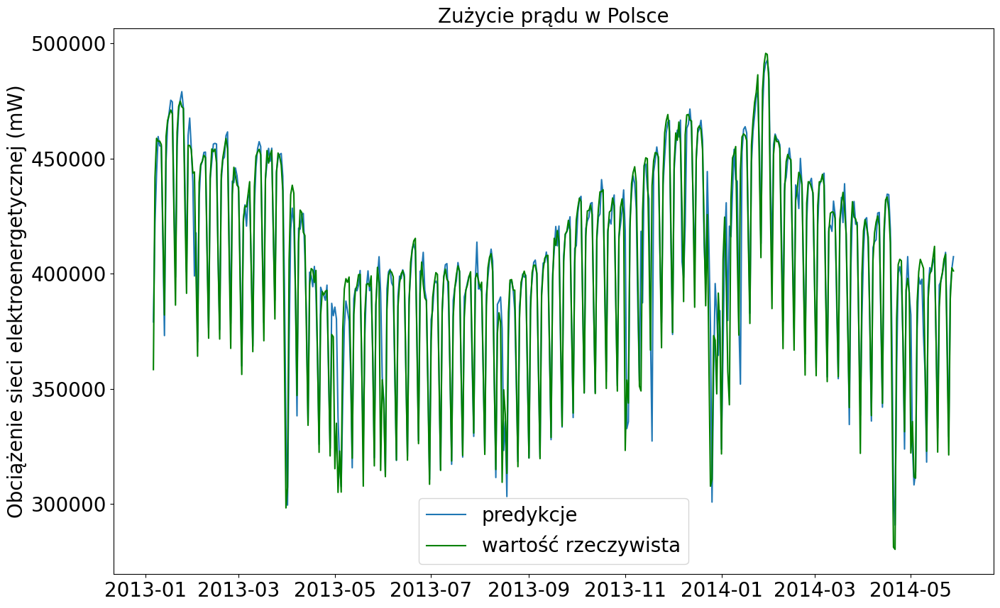

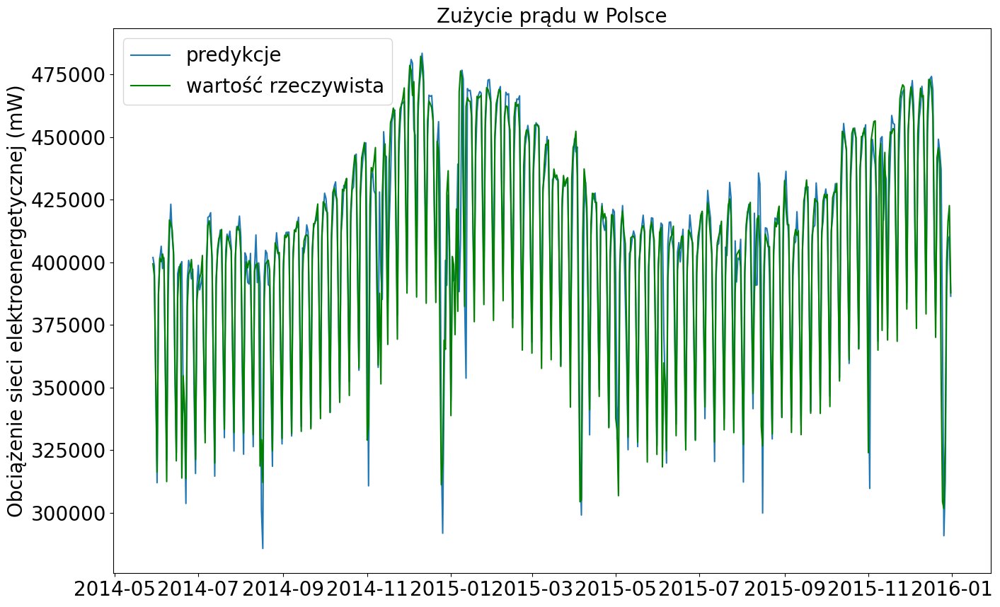

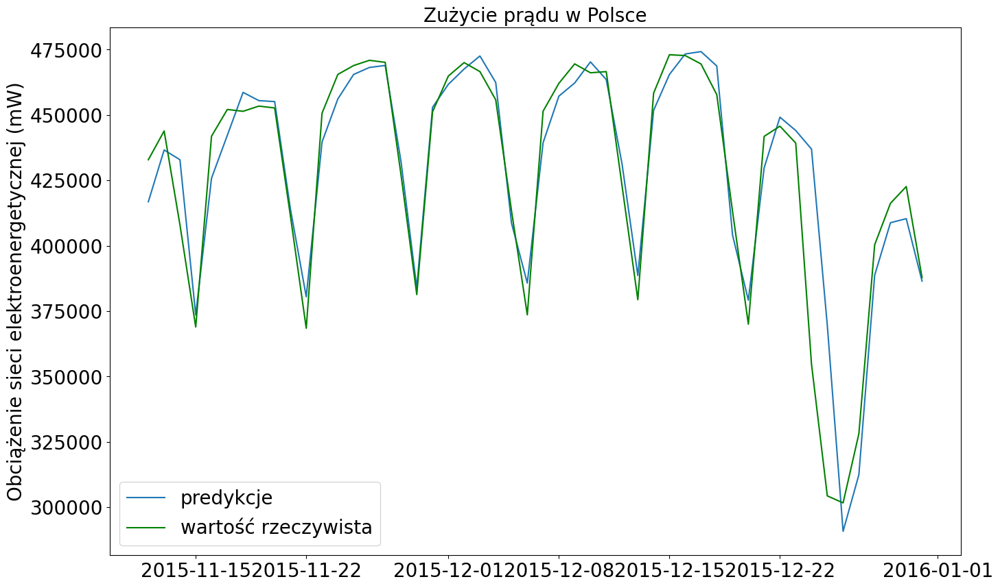

In [72]:
n = 7
GRU_tuple_7PL = train_loop(n, n_trials, country='PL')

In [73]:
GRU_tuple_7PL

(<keras.src.engine.sequential.Sequential at 0x7edb17597670>,
 [428568922.38378906,
  153507797.63992745,
  145556943.25598958,
  224416116.06115422,
  231283667.87049258],
 [428568922.38378906,
  153507797.63992745,
  145556943.25598958,
  224416116.06115422,
  231283667.87049258],
 [-20701.90625,
  2748.8616071428573,
  317.05625,
  -966.8928938356164,
  -680.8838016055046],
 [20701.90625,
  32129.250637755104,
  35698.289930555555,
  46581.75653570088,
  45743.725946995204],
 [0.057767656579186026,
  0.07768510389092863,
  0.0840731165589955,
  0.11980113445028269,
  0.11661014559597861],
 array([-20701.906 ,  19660.938 ,  15175.6875, ...,   7422.7188,
         12290.531 ,   1360.0938], dtype=float32),
 <keras.src.callbacks.History at 0x7edac8f66320>)

Trial 30 Complete [00h 00m 42s]
val_loss: 0.07423138618469238

Best val_loss So Far: 0.05899466574192047
Total elapsed time: 00h 30m 52s
[INFO] optimal number of model layers: 3
[INFO] optimal number of *neuron (multiply): 74
[INFO] training the best model...
Epoch 1/1000
72/72 [==============================] - 7s 25ms/step - loss: 0.5735 - mse: 0.5735 - root_mean_squared_error: 0.7573 - val_loss: 0.3821 - val_mse: 0.3821 - val_root_mean_squared_error: 0.6181
Epoch 2/1000
72/72 [==============================] - 1s 13ms/step - loss: 0.2381 - mse: 0.2381 - root_mean_squared_error: 0.4879 - val_loss: 0.2580 - val_mse: 0.2580 - val_root_mean_squared_error: 0.5079
Epoch 3/1000
72/72 [==============================] - 1s 12ms/step - loss: 0.1814 - mse: 0.1814 - root_mean_squared_error: 0.4260 - val_loss: 0.2297 - val_mse: 0.2297 - val_root_mean_squared_error: 0.4793
Epoch 4/1000
72/72 [==============================] - 1s 9ms/step - loss: 0.1729 - mse: 0.1729 - root_mean_squared_error: 0.4

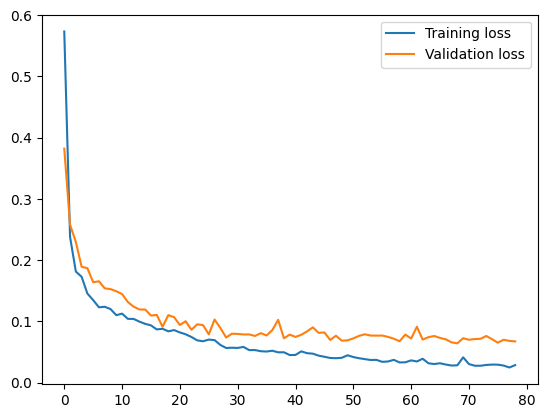

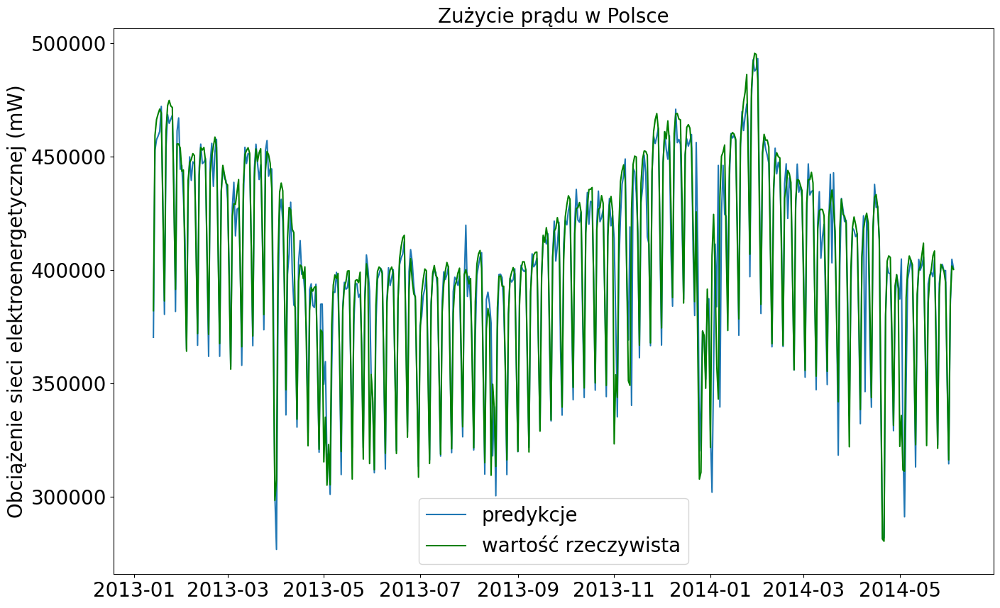

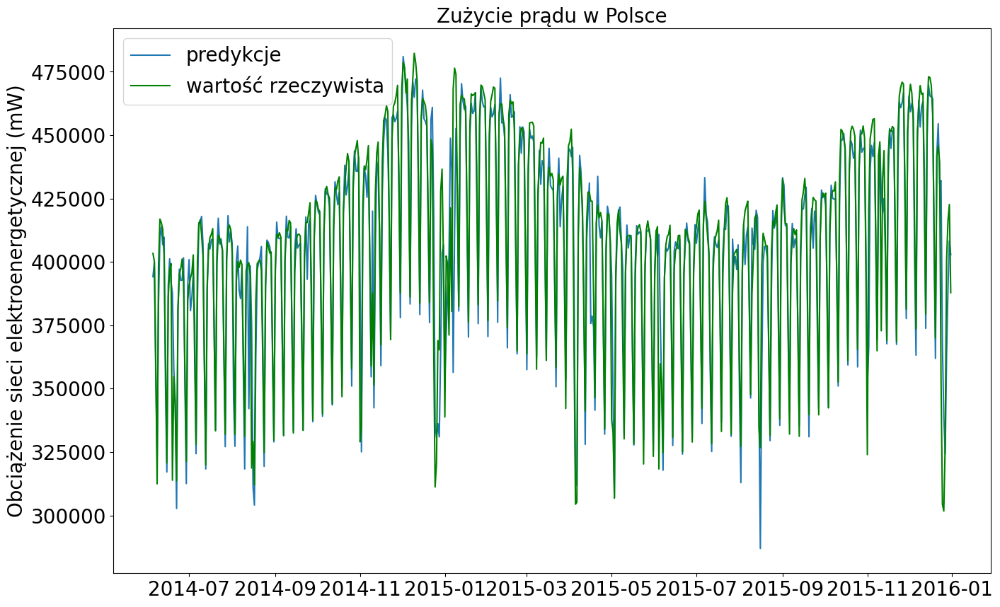

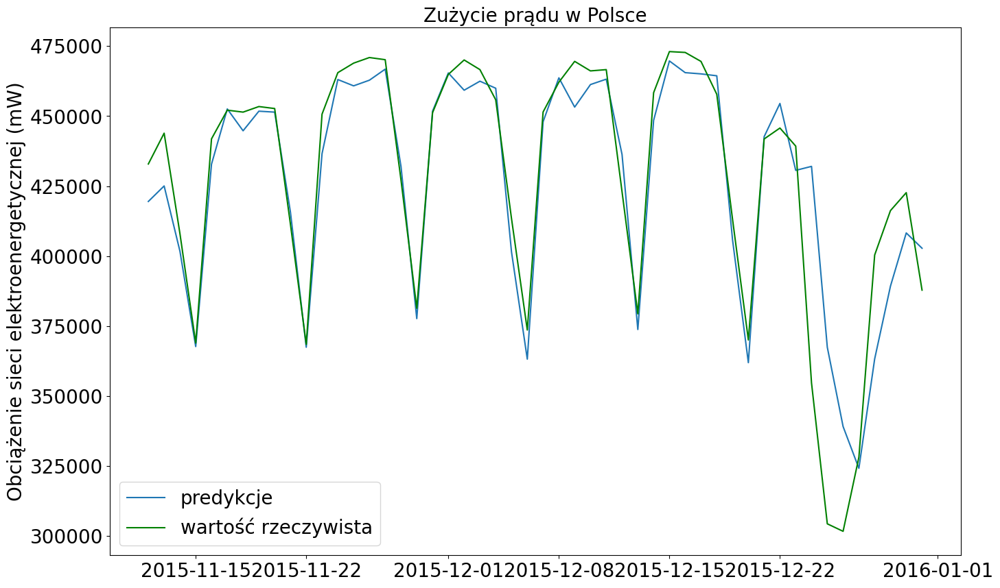

In [74]:
n = 14
GRU_tuple_14PL = train_loop(n, n_trials, country='PL')

In [75]:
GRU_tuple_14PL

(<keras.src.engine.sequential.Sequential at 0x7edb104be560>,
 [137965579.515625,
  66719682.52832031,
  55732187.09886067,
  264311841.6040989,
  222415346.45164168],
 [137965579.515625,
  66719682.52832031,
  55732187.09886067,
  264311841.6040989,
  222415346.45164168],
 [11745.875,
  5896.191964285715,
  2677.759375,
  1455.6517123287672,
  1547.818588411819],
 [11745.875,
  32006.13456632653,
  34549.6825,
  46654.059890692435,
  45824.50868317995],
 [0.0307420866943399,
  0.07382812938957183,
  0.08105858073851896,
  0.11971027796288164,
  0.1165164916055457],
 array([ 11745.875 ,   6589.25  ,   8918.844 , ...,  26979.438 ,
         14394.469 , -14962.3125], dtype=float32),
 <keras.src.callbacks.History at 0x7edac8665480>)

Trial 30 Complete [00h 01m 00s]
val_loss: 0.06798090040683746

Best val_loss So Far: 0.06798090040683746
Total elapsed time: 00h 26m 12s
[INFO] optimal number of model layers: 4
[INFO] optimal number of *neuron (multiply): 30
[INFO] training the best model...
Epoch 1/1000
72/72 [==============================] - 11s 26ms/step - loss: 0.6366 - mse: 0.6366 - root_mean_squared_error: 0.7979 - val_loss: 0.5839 - val_mse: 0.5839 - val_root_mean_squared_error: 0.7641
Epoch 2/1000
72/72 [==============================] - 1s 10ms/step - loss: 0.4299 - mse: 0.4299 - root_mean_squared_error: 0.6557 - val_loss: 0.3684 - val_mse: 0.3684 - val_root_mean_squared_error: 0.6069
Epoch 3/1000
72/72 [==============================] - 1s 10ms/step - loss: 0.2414 - mse: 0.2414 - root_mean_squared_error: 0.4913 - val_loss: 0.2690 - val_mse: 0.2690 - val_root_mean_squared_error: 0.5187
Epoch 4/1000
72/72 [==============================] - 1s 11ms/step - loss: 0.2108 - mse: 0.2108 - root_mean_squared_error: 0

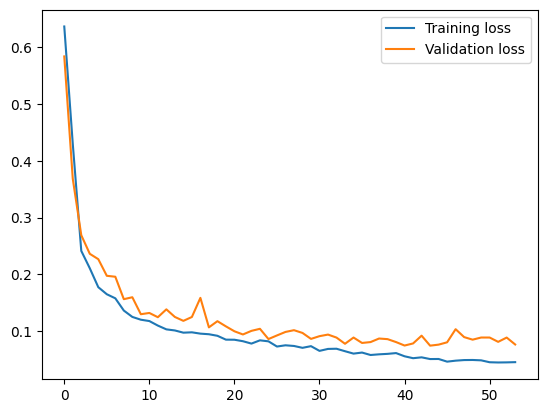

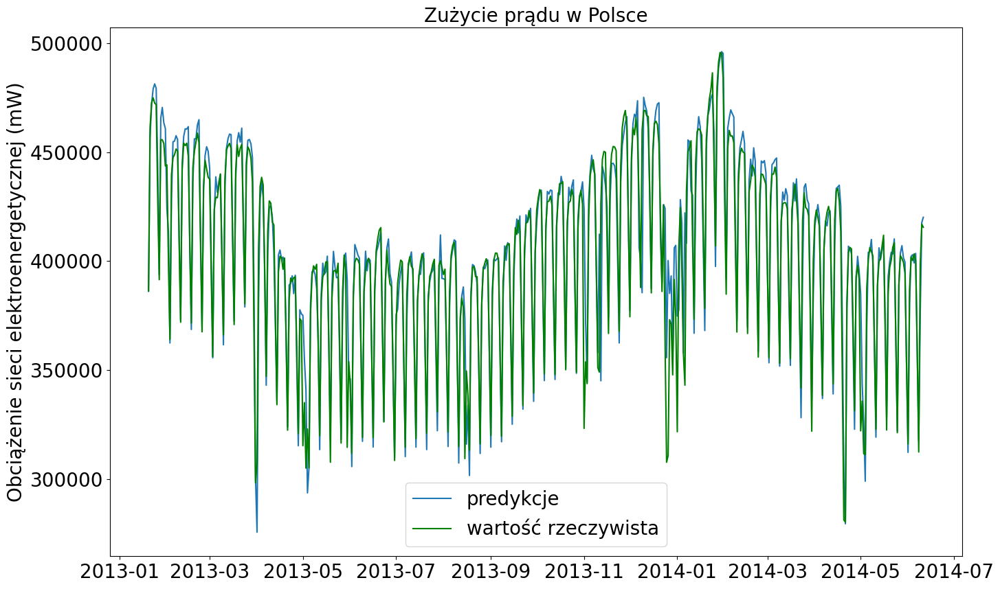

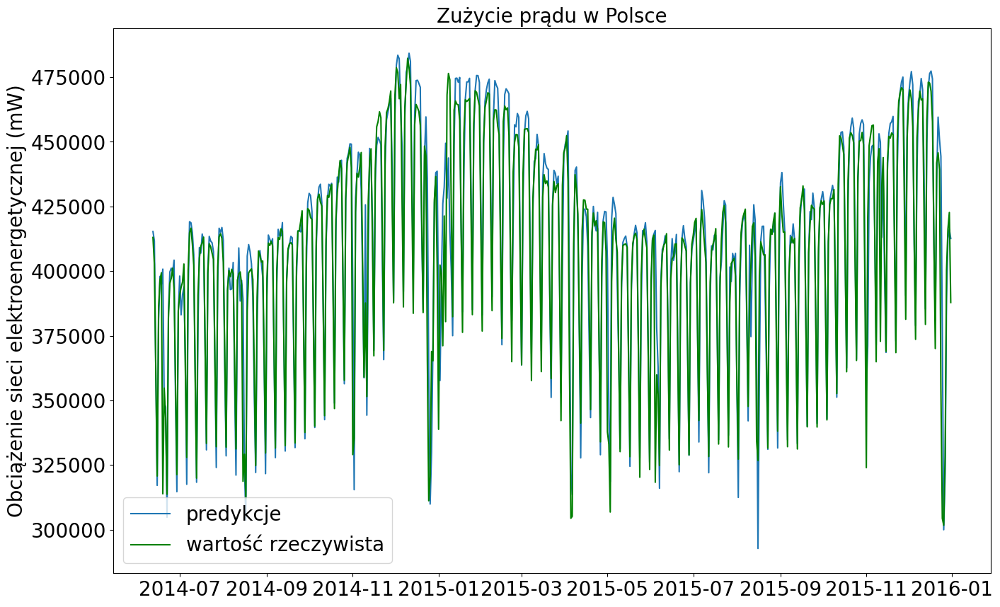

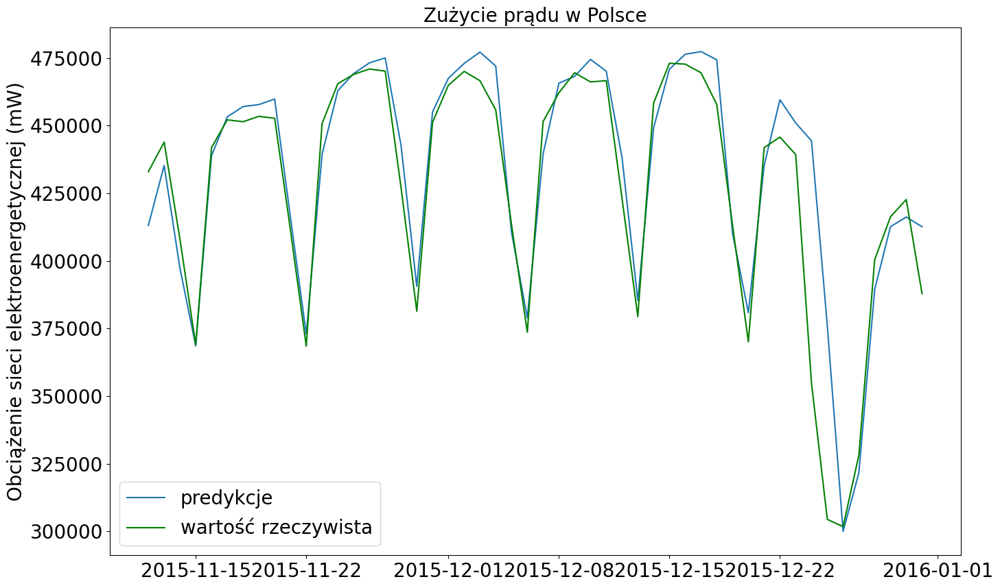

In [76]:
n = 21
GRU_tuple_21PL = train_loop(n, n_trials, country='PL')

In [ ]:
GRU_tuple_21PL

In [ ]:
n = 28
GRU_tuple_28PL = train_loop(n, n_trials, country='PL')

In [ ]:
GRU_tuple_28PL

In [ ]:
n = 7
GRU_tuple_7IT = train_loop(n, n_trials, country='IT')

In [ ]:
GRU_tuple_7IT

In [ ]:
n = 14
GRU_tuple_14IT = train_loop(n, n_trials, country='IT')

In [ ]:
GRU_tuple_14IT

In [ ]:
n = 21
GRU_tuple_21IT = train_loop(n, n_trials, country='IT')

In [ ]:
GRU_tuple_21IT

In [ ]:
n = 28
GRU_tuple_28IT = train_loop(n, n_trials, country='IT')

In [ ]:
GRU_tuple_28IT

In [ ]:
n = 7
GRU_tuple_7DE = train_loop(n, n_trials, country='DE')

In [ ]:
GRU_tuple_7DE

In [ ]:
n = 14
GRU_tuple_14DE = train_loop(n, n_trials, country='DE')

In [ ]:
GRU_tuple_14DE

In [ ]:
n = 21
GRU_tuple_21DE = train_loop(n, n_trials, country='DE')

In [ ]:
GRU_tuple_21DE

In [ ]:
n = 28
GRU_tuple_28DE = train_loop(n, n_trials, country='DE')

In [ ]:
GRU_tuple_28DE